## Ohad Lavie 
## Ronen Hristoforov 

## About the Dataset

Source: https://archive.ics.uci.edu/dataset/2/adult
This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics). The weights on the Current Population Survey (CPS) files are controlled to independent estimates of the civilian noninstitutional population of the US. The original dataset contains around 48,000 rows but for faster computation we will be using only 2000 rows in this section.

  <u>Content</u>

- **age**: Age of the person  
- **workclass**: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked  
- **fnlwgt**: continuous  
- **education**: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool  
- **education-num**: continuous  
- **marital-status**: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse  
- **occupation**: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces  
- **relationship**: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried  
- **race**: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black  
- **sex**: Female, Male  
- **capital-gain**: continuous  
- **capital-loss**: continuous  
- **hours-per-week**: continuous  
- **native-country**: Country of origin for the person  

### Imports

In [1]:

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import plotly.express as px
import warnings
warnings.filterwarnings(
    "ignore",
    message="No artists with labels found to put in legend"
)
from ucimlrepo import fetch_ucirepo
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import Normalizer
from sklearn.metrics import silhouette_score , silhouette_samples
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster       import AgglomerativeClustering



### Importing the Data from the source


In [2]:

# 1. Fetch the Adult dataset (ID=2)
adult = fetch_ucirepo(id=2)

# 2. Extract features and target
X = adult.data.features        # pandas DataFrame
y_raw = adult.data.targets         # could be a Series or 1-col DataFrame

# 3. Turn y_raw into a flat Series named “income”


if isinstance(y_raw, pd.DataFrame):
    y = y_raw.iloc[:, 0]           # grab the single column
else:
    y = pd.Series(y_raw)

y.name = 'income'

#concatenate X and y into a single DataFrame
df = pd.concat([X, y], axis=1)



<h1 style="text-align: center;">EDA</h1>

## First look at the Data

In [3]:
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)     # Show all rows
df.head(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K


In [4]:
df.shape

(48842, 15)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education-num   48842 non-null  int64 
 5   marital-status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital-gain    48842 non-null  int64 
 11  capital-loss    48842 non-null  int64 
 12  hours-per-week  48842 non-null  int64 
 13  native-country  48568 non-null  object
 14  income          48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


## Data cleaning

### Checking for misssing values

Columns with missing values:
workclass         963
occupation        966
native-country    274
dtype: int64
----------------------
Percentage of missing values per column :
workclass         1.971664
occupation        1.977806
native-country    0.560993
dtype: float64


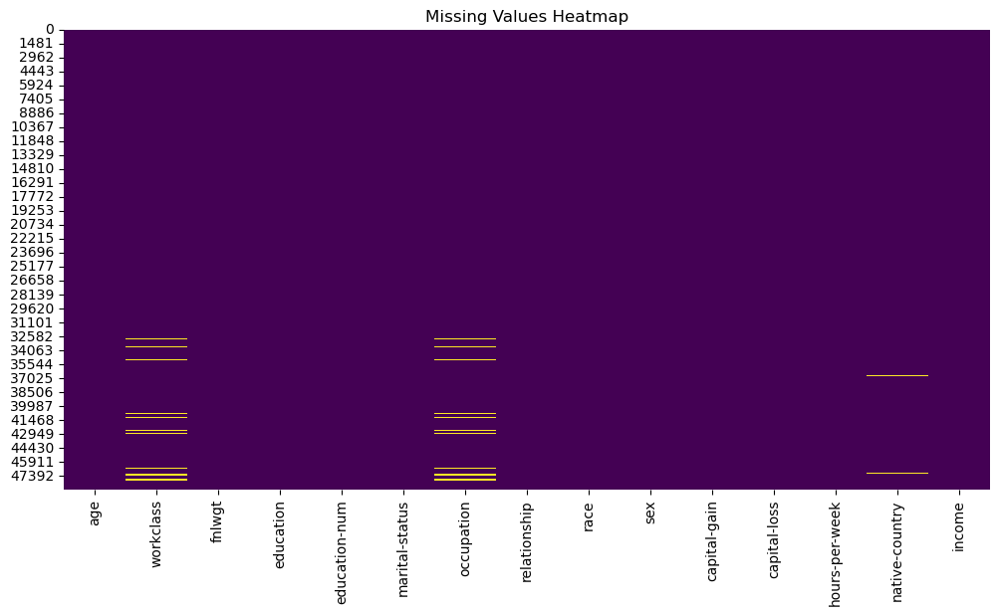

In [6]:
#print only columns with missing values
print("Columns with missing values:")
missing_columns = df.columns[df.isnull().any()]
num_missing_values = df[missing_columns].isnull().sum()
print(num_missing_values)
print("----------------------")
# to get a better understanding of what percentage of the columns are missing
missing_percentage = df[missing_columns].isnull().sum() / len(df) * 100
print(f"Percentage of missing values per column :\n{missing_percentage}")
# Visualizing the missing values
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

### Based on missing values percentiles, we think that we can infer meaningful data from the missing values.
- By replacing the "null" values with the string "missing" we can hopefully learn from the dataset.
- We think that the missing data is refering to unoccupied people, however we're not certain, as it was not mentioned on the dataset documentation.

- The missing values in the 'native country' column will be dropped as they are very scarce and we believe they dont contribute to any relevant question.

In [7]:
df['workclass'] = df['workclass'].fillna('missing')
df['occupation'] = df['occupation'].fillna('missing')
#drop the rows with missing values in the 'native-country' column
df = df.dropna(subset=['native-country'])

### Verifying that the Data cleaning worked

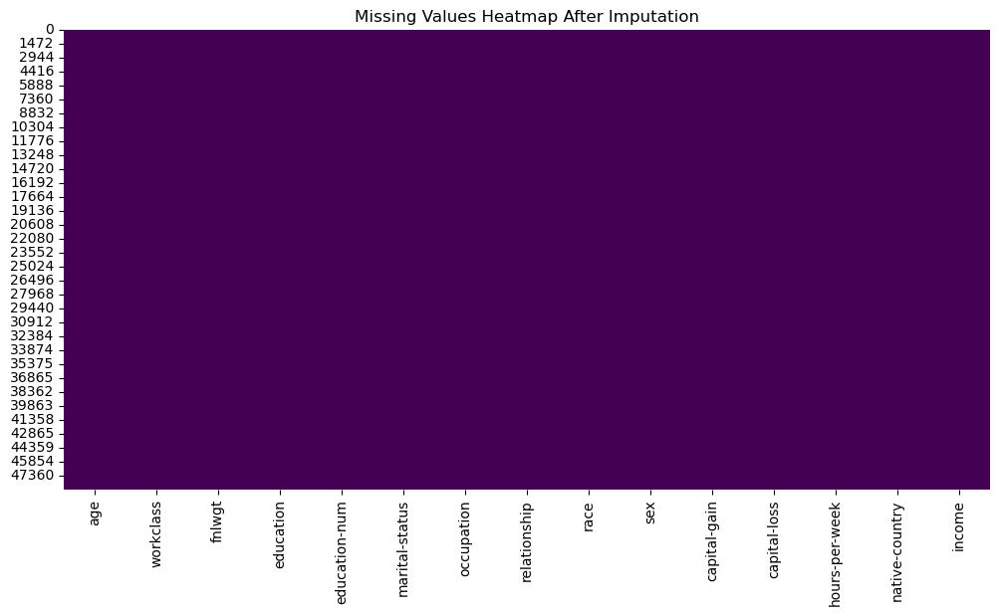

In [8]:
# checking for missing values and plotting the heatmap again
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap After Imputation')    
plt.show()

Unique values per column :
age                  74
workclass            10
fnlwgt            28424
education            16
education-num        16
marital-status        7
occupation           16
relationship          6
race                  5
sex                   2
capital-gain        123
capital-loss         99
hours-per-week       96
native-country       42
income                4
dtype: int64


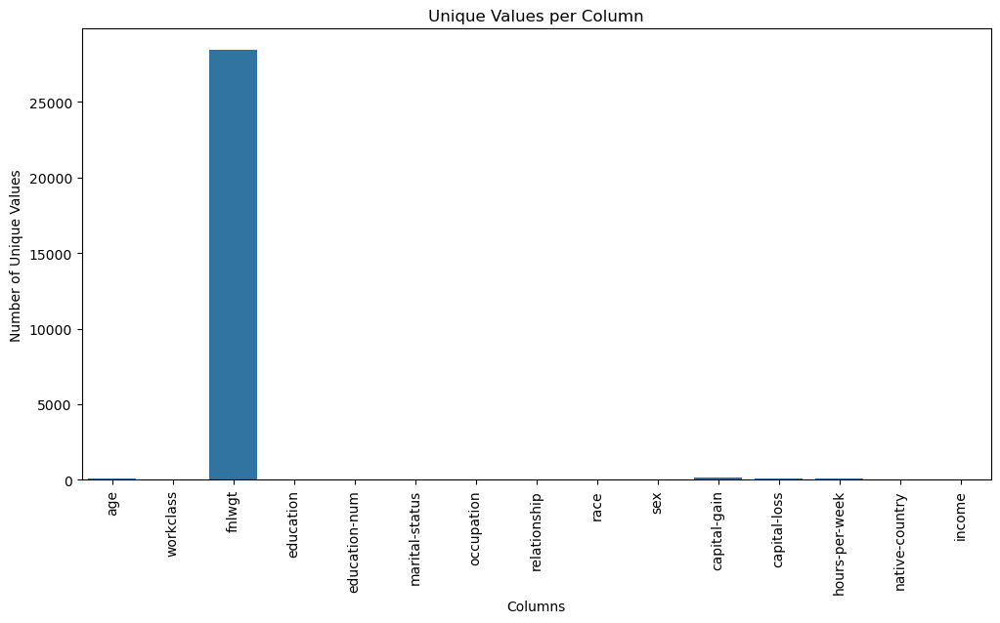

In [9]:
#we want to see how many unique values are in each column and plot them using countplot
unique_values = df.nunique()
print(f"Unique values per column :\n{unique_values}")
# Plotting the unique values
plt.figure(figsize=(12, 6))
sns.barplot(x=unique_values.index, y=unique_values.values)
plt.xticks(rotation=90)
plt.title('Unique Values per Column')
plt.xlabel('Columns')
plt.ylabel('Number of Unique Values')
plt.show()



#### The column "fnlwgt" looks odd - it has 28k unique value, we assume that it can be something like  the id of each person, but then it means that there are duplicated rows

In [10]:
#lets check the odd values in fnlwgt
df['fnlwgt'].describe()


count    4.856800e+04
mean     1.896385e+05
std      1.056425e+05
min      1.228500e+04
25%      1.175085e+05
50%      1.781570e+05
75%      2.375868e+05
max      1.490400e+06
Name: fnlwgt, dtype: float64

<u> Observation :</u>
- didnt get anything intresting.

 <u>Conclusion :</u>
- we will drop this column as we cannot attain meaningful insights from it.


In [11]:
 # dropping the fnlwgt column
df.drop(columns=['fnlwgt'], inplace=True) 
df.head()

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


### we want to inspect the columns where we found missing values : 
- 'workclass' 
- 'occupation'

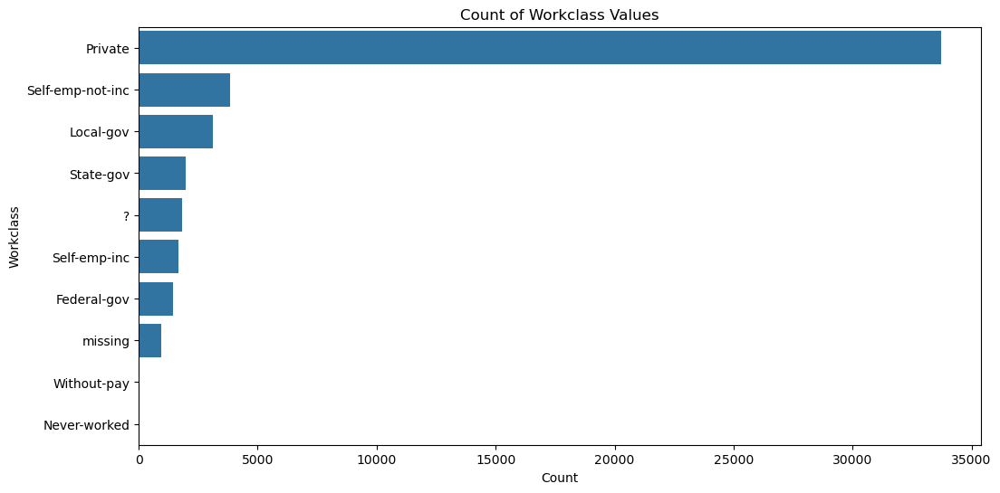

In [12]:
#lets see the values  in the 'workclass' column
df['workclass'].value_counts()
#plot the values in the 'workclass' column
plt.figure(figsize=(12, 6))
sns.countplot(y='workclass', data=df, order=df['workclass'].value_counts().index)
plt.title('Count of Workclass Values')
plt.xlabel('Count')
plt.ylabel('Workclass')
plt.show()





<u>Observation:</u>

 we can see that theres a unknown value '?' 

<u>Conclusion :</u>

 we will add this value to 'missing' value.



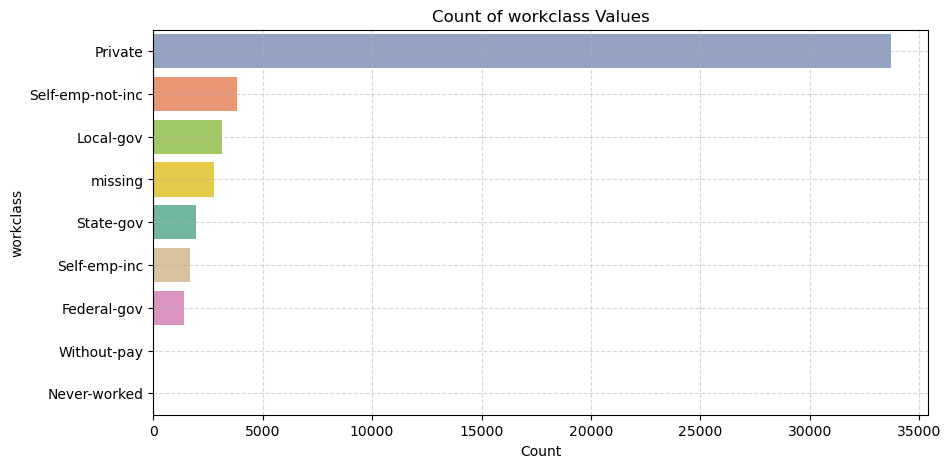

In [13]:
#adding the '?' values to the missing values
df['workclass'] = df['workclass'].replace('?', 'missing')
# creating a function to plott the values in the  column again
def plot_column_values(column_name):
    plt.figure(figsize=(10, 5))
    sns.countplot(y=column_name, data=df, order=df[column_name].value_counts().index, hue= column_name, palette='Set2')
    plt.title(f'Count of {column_name} Values')
    plt.xlabel('Count')
    plt.ylabel(column_name)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()
# plotting the values in the 'workclass' column again
plot_column_values('workclass')


<h3><u> Observation :</h3></u>

- ~70% of the Data consists of people working in the Private sector.

- There are 3 goverment workclasses : Federal-gov, State-gov, Local-gov

<h3><u> Conclusion :</h3></u>

- We can create one category called Goverment and unite all 3 workclasses as one.

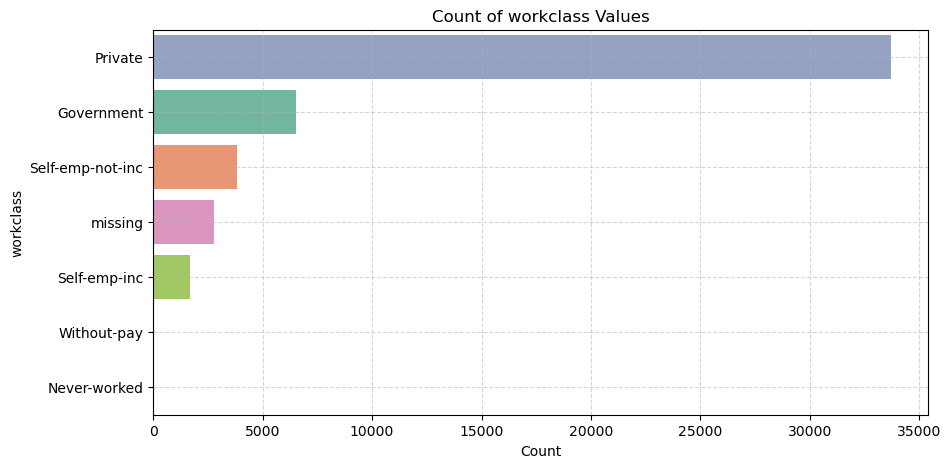

In [14]:
# creating a new value called 'Goverment' for the 'workclass' column
df['workclass'] = df['workclass'].replace(['Federal-gov', 'Local-gov', 'State-gov'], 'Government')
# plotting the values in the 'workclass' column again
plot_column_values('workclass')

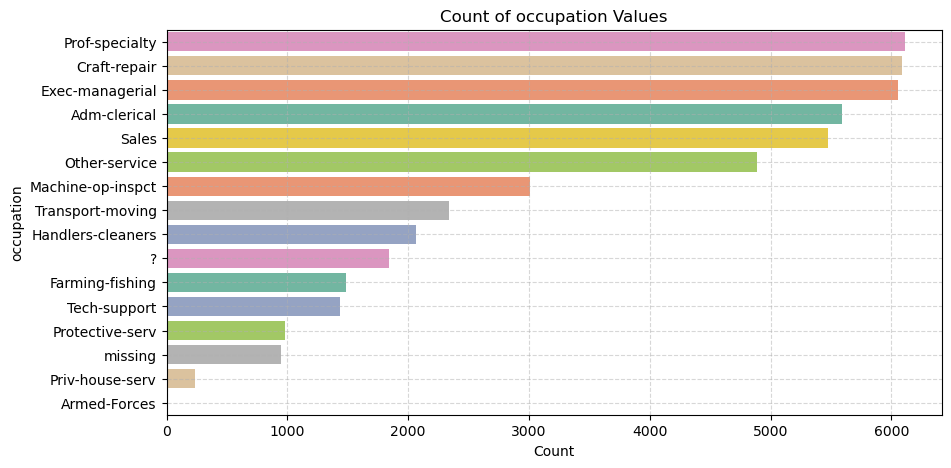

In [15]:
#chcecking if the '?' phenomenon is present in the 'occupation' column and plotting the values in the 'occupation' column
plot_column_values('occupation')


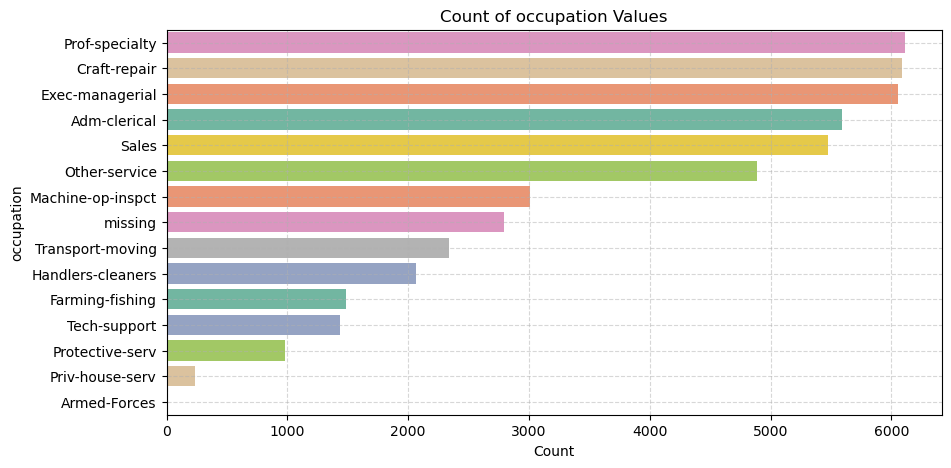

In [16]:
#adding the '?' values to the missing values
df['occupation'] = df['occupation'].replace('?', 'missing')
#plotting the values in the 'occupation' column after replacing '?' with 'missing'
plot_column_values('occupation')

<h3><u> Observation :</h3></u>

- Top Three Occupations Are Almost Tied :
	
	Prof-specialty (~6,200), Craft-repair (~6,100), and Exec-managerial (~6,000) are the most frequent categories, each appearing in roughly 6 K of the ~48 K rows.

	Together, those three alone make up about 37 % of all records. In other words, more than third of the dataset works in professional specialties, crafts/repairs, or executive/managerial roles.
- Mid‐Tier Occupations:
	•	Adm-clerical (~5,500) and Sales (~5,300) also appear very often (each roughly 5.5–5.3 K).
	•	Other-service (~4,800) rounds out the “top six” occupations, meaning nearly half of everyone falls into these six job categories.
- Long Tail of Less Common Jobs
	•	After “Other-service,” counts drop sharply



<h3><u> Implications :</h3></u>

- High‐frequency categories (Prof-specialty, Craft-repair, Exec-managerial, Adm-clerical, Sales, Other-service) together account for ~60 % of the data. It might make sense to leave those as distinct dummy variables.

- Rare occupations ( Priv-house-serv, Armed-Forces, and perhaps anything under ~1 % frequency) could be grouped into an “Other” or “Rare” bucket, or we can drop them if they add noise.

In [17]:
#checking if there are any '?' values in our dataframe
df[df.isin(['?']).any(axis=1)].head()



,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
14,40,Private,Assoc-voc,11,Married-civ-spouse,Craft-repair,Husband,Asian-Pac-Islander,Male,0,0,40,?,>50K
38,31,Private,Some-college,10,Married-civ-spouse,Sales,Husband,White,Male,0,0,38,?,>50K
51,18,Private,HS-grad,9,Never-married,Other-service,Own-child,White,Female,0,0,30,?,<=50K
61,32,missing,7th-8th,4,Married-spouse-absent,missing,Not-in-family,White,Male,0,0,40,?,<=50K
93,30,Private,HS-grad,9,Married-civ-spouse,Sales,Wife,Asian-Pac-Islander,Female,0,1573,35,?,<=50K


We can see that the '?' values are shown in the 'native-country' column, which makes sense. we will replace it with 'missing' as in the last columns we have checked, and continue to search for more '?' values in other columns

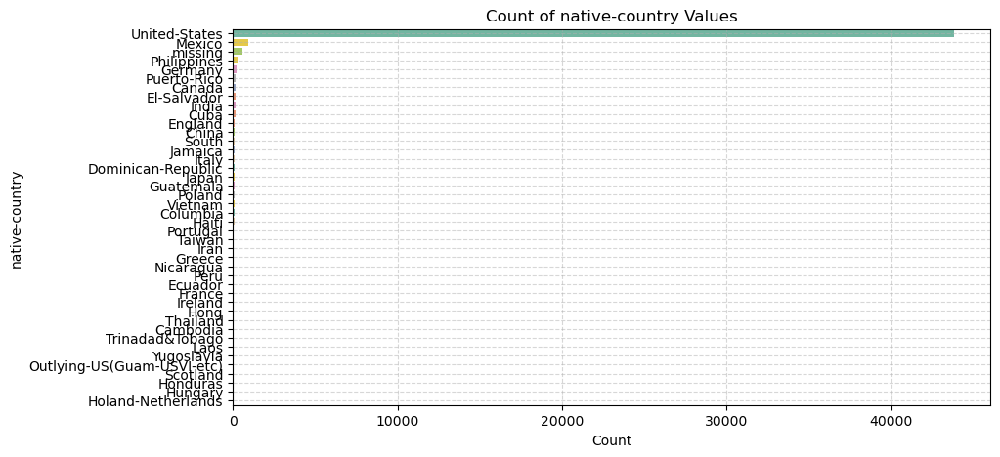

In [18]:

df.replace({'native-country': {'?': 'missing'}}, inplace=True)
#plotting the values in the 'native-country' column
plot_column_values('native-country')


<h3><u> Observation :</h3></u>

- ~91% of the data consists of people from the US

- ~2% of the data consists of people from Mexico

- The rest of the countries have less than 0.6% each of the data.

In [19]:
#chekcing if there are any '?' values in a non 'native country' column, if so we will replace them with 'missing'

# Check for '?' values in the entire DataFrame
mask = df.isin(['?'])

# Drop the 'native_country' column from the mask
mask_excl_country = mask.drop(columns=['native-country'])

# Check if any '?' values exist outside 'native_country'
has_question_marks_elsewhere = mask_excl_country.any().any()

print("Are there any '?' outside 'native-country'?", has_question_marks_elsewhere)

Are there any '?' outside 'native-country'? False


In [20]:
df.describe()

,age,education-num,capital-gain,capital-loss,hours-per-week
count,48568.000000,48568.000000,48568.000000,48568.000000,48568.000000
mean,38.642295,10.073608,1075.908726,87.741414,40.424704
std,13.714365,2.568636,7430.021192,403.581741,12.391966
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,48.000000,12.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000


<u><h2>Observation:</u></h2>

- The mean age is around 38.
- Median of education num is 10 --> 50% of the Dataset have education lower than 10th grade, and 50% have education level greater than 10th grade
- After checking the overall USA statistics, we have found that the median for people over 25 in the USA, according to  "2022 American Community Survey" is "some college, no degree", so the dataset doesnt fit the overall population.

    source : https://data.census.gov/table/ACSST1Y2022.S1501?utm_

- we can see the there are no 'anomalie' values like age > 120 or a negative capital-gain ... its a good sign that our data is clean

### Now we know that our data is clean of missing or unidentified Data.

### There are 2 columns with education, maybe 'education-num' is the numerical column of education ?

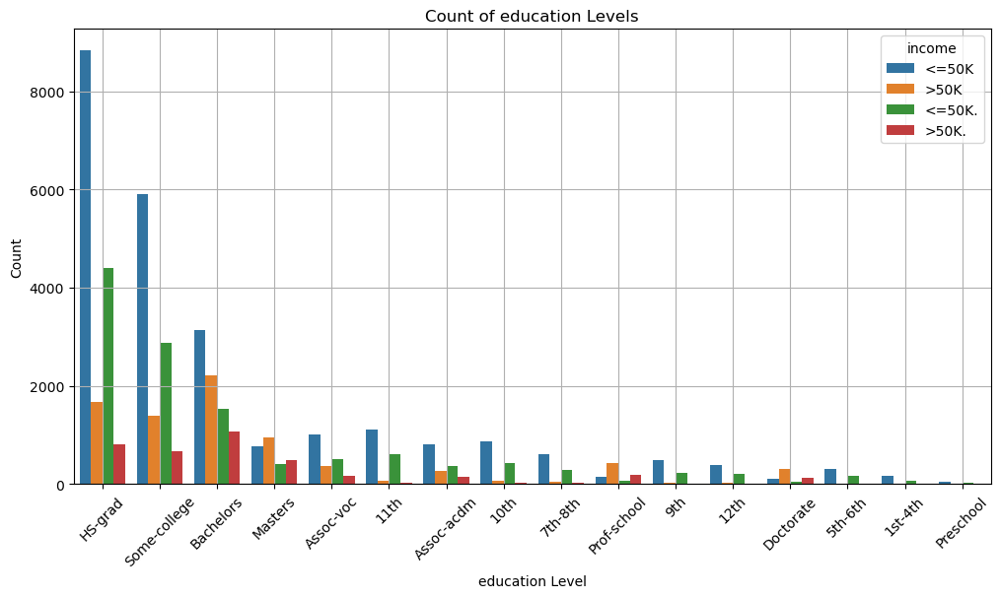

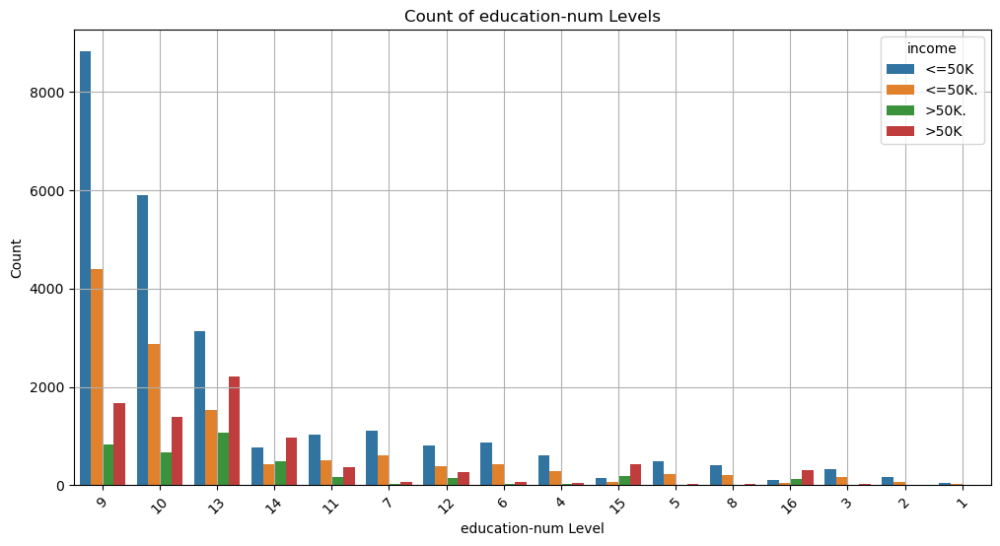

In [21]:
# we want to see if there are any correllations bwtween 'education-num' and 'education'
#lets make a function to plot the 'education' column
def plot_column_distribution(column_name):
    plt.figure(figsize=(12, 6))
    sns.countplot(x=column_name, data=df, order=df[column_name].value_counts().index,hue='income')
    plt.title(f'Count of {column_name} Levels')
    plt.ylabel('Count')
    plt.xlabel(f'{column_name} Level')
    plt.xticks(rotation=45)
    plt.legend(title='income', loc='upper right')
    plt.grid(True)
    plt.show()
# Plotting the 'education' column
plot_column_distribution('education')
#lets plot the 'education-num' column
plot_column_distribution('education-num')


<u><h2>Observation:</u></h2>

There are 4 values to 'income', 2 of which are redundant 

<u><h2>Conclusion:</u></h2>

we will unite them.

In [22]:
#lets union the '<=50k' and '<=50k.' to a one value
df['income'] = df['income'].replace({'<=50K.': '<=50K', '>50K.': '>50K'})
df['income'].value_counts()

income
<=50K    36955
>50K     11613
Name: count, dtype: int64

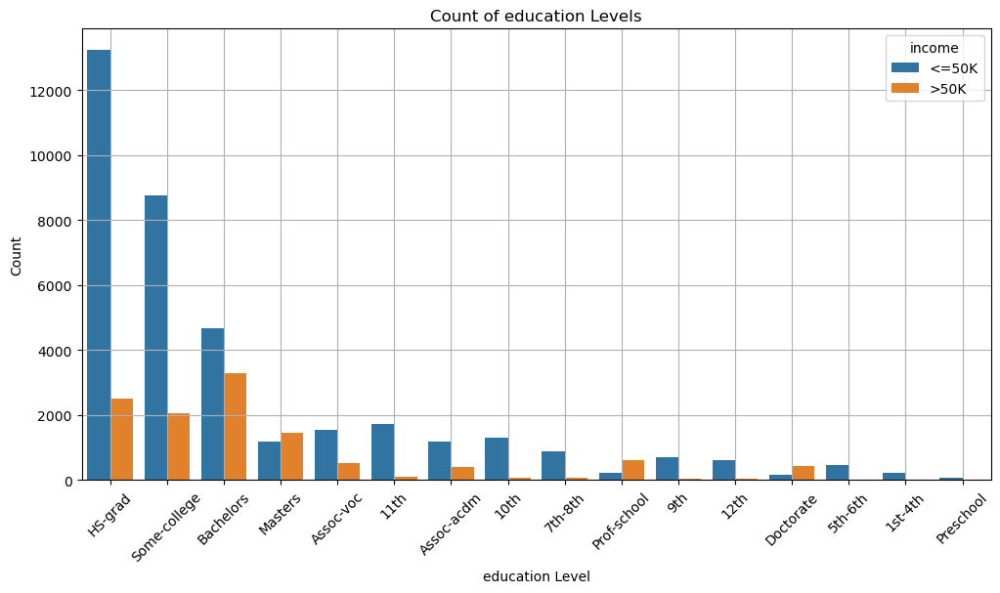

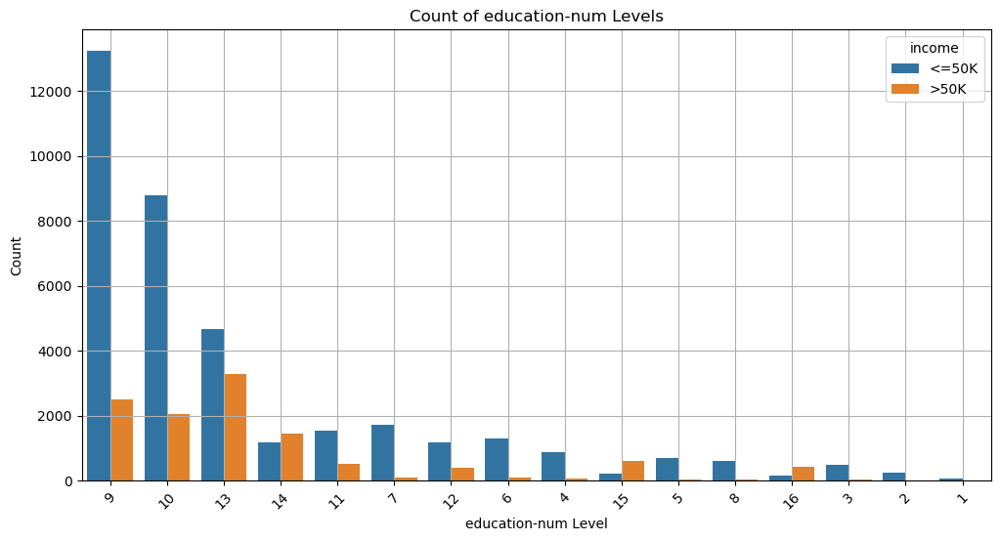

In [23]:
#lets plot the 'education' column
plot_column_distribution('education')
#lets plot the 'education-num' column
plot_column_distribution('education-num')

 it seems as though the 2 plots are identical, however the values are placed differently. 
 
 we need to figure out what values align between the 2 plots.

In [24]:

print(df['education'].value_counts())
print("-------------------------------------------------")
print(df['education-num'].value_counts())

education
HS-grad         15719
Some-college    10827
Bachelors        7960
Masters          2628
Assoc-voc        2054
11th             1808
Assoc-acdm       1591
10th             1384
7th-8th           950
Prof-school       825
9th               753
12th              651
Doctorate         585
5th-6th           505
1st-4th           245
Preschool          83
Name: count, dtype: int64
-------------------------------------------------
education-num
9     15719
10    10827
13     7960
14     2628
11     2054
7      1808
12     1591
6      1384
4       950
15      825
5       753
8       651
16      585
3       505
2       245
1        83
Name: count, dtype: int64


### Now we can see which integer value in 'education-num' matches the value in 'education'


In [25]:
# Pull out the unique combinations
education_pairs = (
    df[['education', 'education-num']]
      .drop_duplicates()
      .sort_values('education-num')
      .reset_index(drop=True)
)
education_pairs


,education,education-num
0,Preschool,1
1,1st-4th,2
2,5th-6th,3
3,7th-8th,4
4,9th,5
5,10th,6
6,11th,7
7,12th,8
8,HS-grad,9
9,Some-college,10


### To give us more information about the numeric values in education-num, we will create a dictionary and store the values as : {education : education-num}

In [26]:
#making a dictionary from the unique combinations
education_dict = education_pairs.set_index('education')['education-num'].to_dict()
education_dict

{'Preschool': 1,
 '1st-4th': 2,
 '5th-6th': 3,
 '7th-8th': 4,
 '9th': 5,
 '10th': 6,
 '11th': 7,
 '12th': 8,
 'HS-grad': 9,
 'Some-college': 10,
 'Assoc-voc': 11,
 'Assoc-acdm': 12,
 'Bachelors': 13,
 'Masters': 14,
 'Prof-school': 15,
 'Doctorate': 16}

In [27]:
#sorting the education column ordinally based on the education-num column
df['education'] = pd.Categorical(
    df['education'],
    categories=education_pairs['education'],
    ordered=True

)

In [28]:
# select the categorical columns as a list
categorical_columns = df.select_dtypes(include=[object, 'category']).columns.tolist()
# select the numerical columns as a list
numerical_columns = df.select_dtypes(include=np.number).columns.tolist()
# analyzing which categorical column we can one-hot encode and which we can label encode
print(f'categorical columns : {categorical_columns}')
print(f'numerical columns : {numerical_columns}')


categorical columns : ['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'native-country', 'income']
numerical columns : ['age', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week']


## Analyzing the categorical columns before we encode them 
- We already analyzed 'native-country' , which consists mainly of 'USA' born  (~91%).
- Whats left : 'workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'income'.

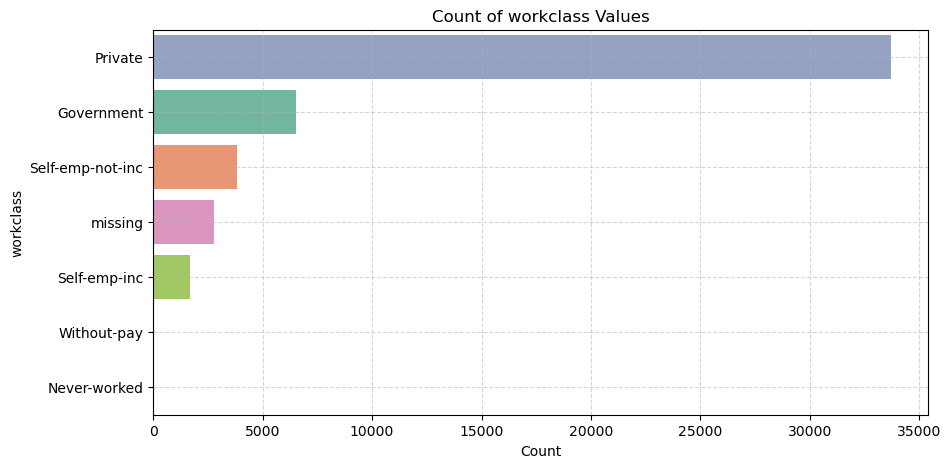

In [29]:
#plot workclass distribution
plot_column_values('workclass')

<u><h2>Observations :</u></h2>
- Dominance of the Private Sector : Roughly 70% of records list “Private” employment.
- “Government” comes  second at about 12–14% of the data.
- ~2,800 “missing” entries (~6% of the Data).
- “Without-pay” and “Never-worked” are extremely scarce (<1%).

<u><h2>Implications :</u></h2>
- Our Data is heavily skewed toward private-sector workers.
- Grouping “Without-pay” and “Never-worked” as "Other".



In [30]:
#grouping “Without-pay,” “Missing,” and “Never-worked” into a single  “Other” category in the workclass column
df['workclass'] = df['workclass'].replace(['Without-pay', 'Never-worked'], 'Other')

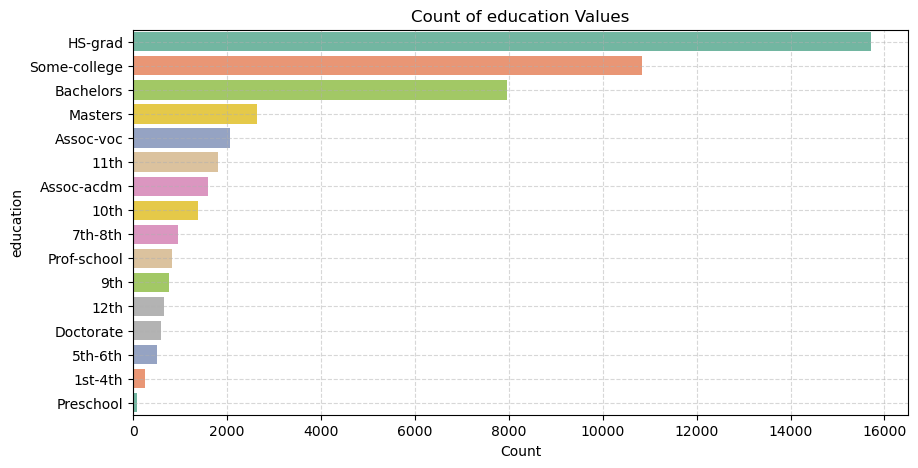

In [31]:
#plotting 'education' column distribution
plot_column_values('education')

<u><h2>Observations :</u></h2>
- Heavily skewed toward mid-levels

	•	HS-grad (~15 800, ~32 %) is the single largest bin, followed by Some-college (~11 000, ~22 %) and Bachelors (~8 000, ~16 %).

	•	Together, those top three account for ~70 % of your sample.
- Clear ordering

	•	Unlike nominal categorizations, these bins have a strict hierarchy—no need to treat them as unordered factors.

<u><h2>Implications :</u></h2>
- Using ordinal encoding on 'education' column.


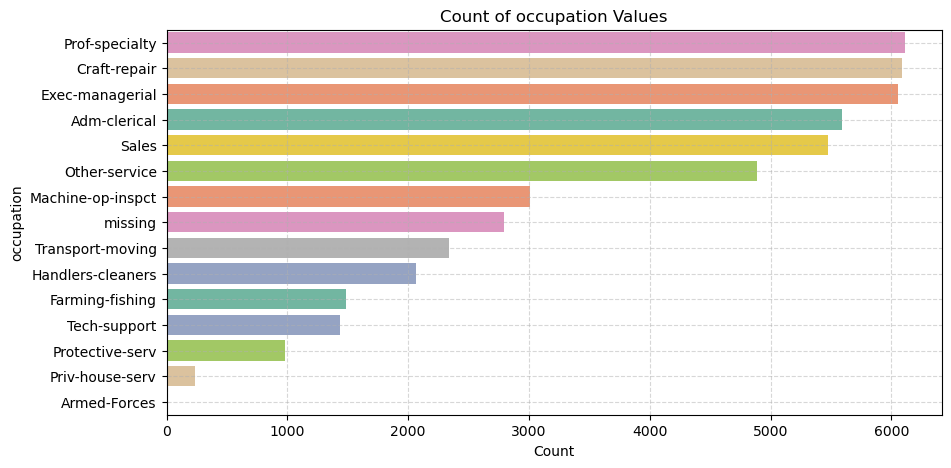

In [32]:
#plotting 'occupation' column distribution
plot_column_values('occupation')

<u><h2>Observations :</u></h2>
- Top professions dominate

	•	Prof-specialty, Craft-repair, Exec-managerial, Adm-clerical, Sales, and Other-service together make up roughly 60–65% of all records.
- Mid-frequency roles

	•	Machine-op-inspct (~6%), Transport-moving (~5%), and Handlers-cleaners (~4%) appear with moderate frequency.

- Rare categories

	•	Farming-fishing, Tech-support, and Protective-serv each fall between 2–3%, while Priv-house-serv (~0.5%) and Armed-Forces (<0.2%) are vanishingly small.


<u><h2>Implications :</u></h2>
- Reduce sparsity by grouping

	• We can collapse the very rare levels (Priv-house-serv, Armed-Forces, Protective-serv, Tech-support) into a single “Other” bucket.

In [33]:
df['occupation'] = df['occupation'].replace(['Armed-Forces', 'Priv-house-serv','Protective-serv','Tech-support'], 'Other-Rare')

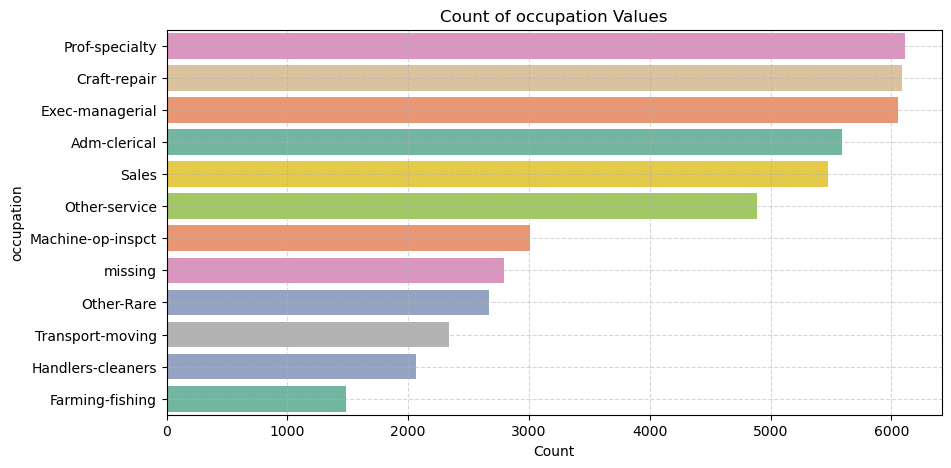

In [34]:
plot_column_values('occupation')

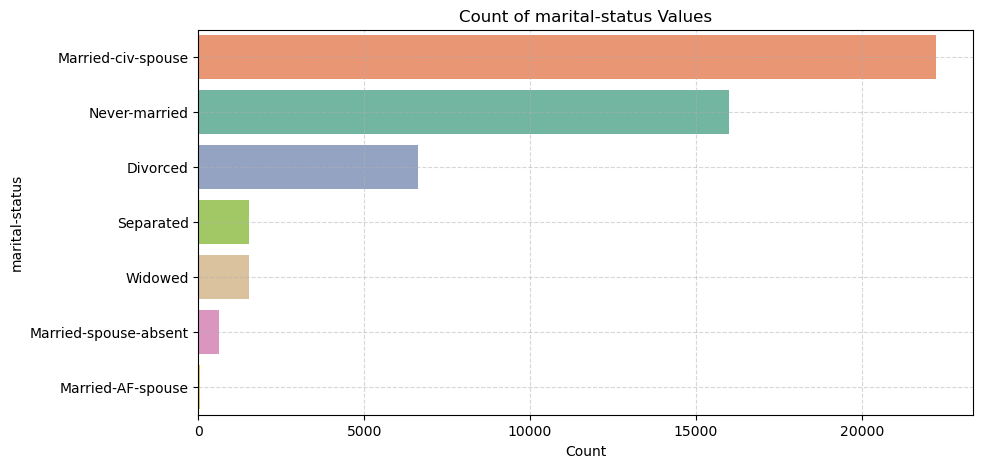

In [35]:
#ploting occupation distribution
plot_column_values('marital-status')

<u><h2>Observations :</u></h2>
- Dominant categories : Married-civ-spouse (~45%) and Never-married (~32.5%) together account for roughly 78% of all records.
- Mid-tier level : Divorced is the only other category in double digits at 13.6%.
- Small minorities : Separated and Widowed each appear in about 3.7% of rows.
- Very rare levels : Married-spouse-absent (~1.2%) and Married-AF-spouse (~0.1%) combined make up barely 1–2%.

<u><h2>Implications :</u></h2>
- Dimensionality reduction : We can group together the very rare categories : Married-spouse-absent,and Married-AF-spouse.




In [36]:
#grouping 'married-civ-spouse' and 'married-spouse-absent' into a single 'Other' category due to their low frequency
df['marital-status'] = df['marital-status'].replace(['Married-AF-spouse', 'Married-spouse-absent'], 'Other')

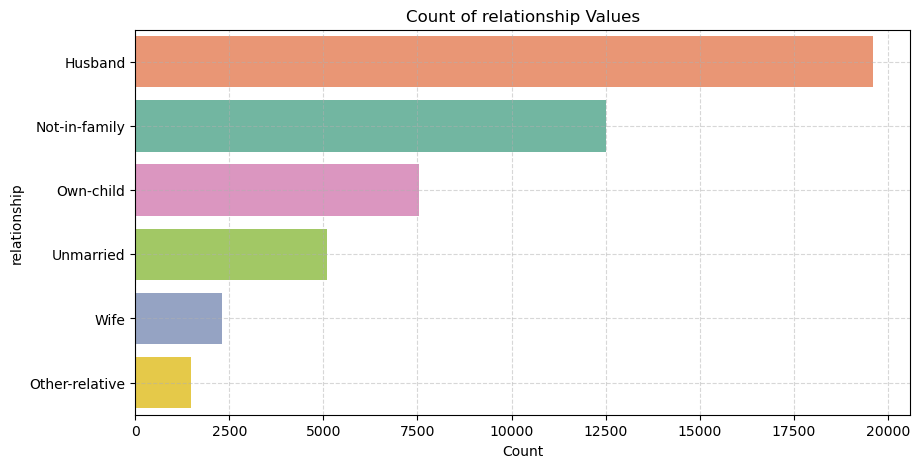

In [37]:
plot_column_values('relationship')

<u><h2>Observations :</u></h2>
- Husband is the most common relationship (≈19,800 records, ~40%).
- “Wife” is  relatively small (~5%)

<u><h2>Implications :</u></h2>
- Feature engineering : Group 'Husband' and 'wife' together to 'Spouse'.


In [38]:
df['relationship'] = df['relationship'].replace(['Husband', 'Wife'], 'Spouse')

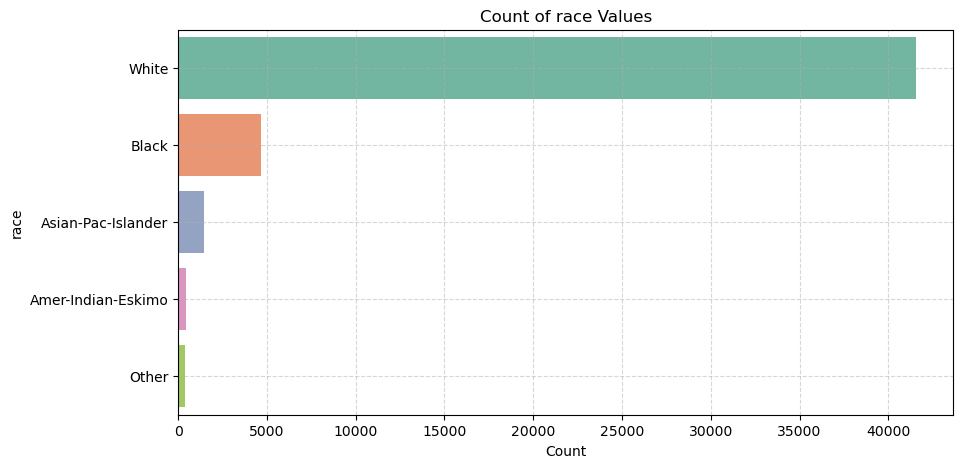

In [39]:
#plotting 'race' column distribution
plot_column_values('race')

<u><h2>Observations :</u></h2>
-  Our Data is dominated by 'White' which account for roughly 80–85%.
- Asian-Pac-Islander is only 3–4%, while Amer-Indian-Eskimo and Other are each under 1%.

<u><h2>Implications :</u></h2>
- Feature engineering : group 'Amer-Indian-Eskimo' and 'Other' into a single “Other-Race” bucket.

In [40]:
df['race'] = df['race'].replace(['Amer-Indian-Eskimo', 'Other'], 'Other-Race')

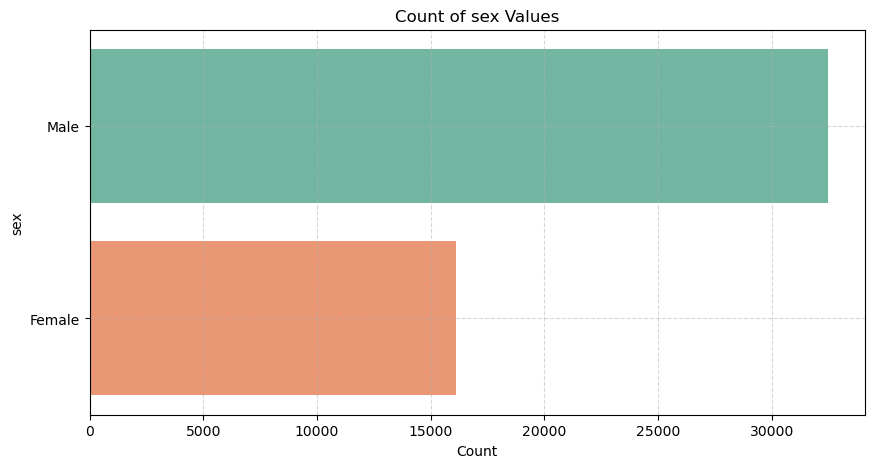

In [41]:
#plotting 'sex' column distribution
plot_column_values('sex')

<u><h2>Observations :</u></h2>
- Male makes up about 67% of the Data.
- Female accounts for the remaining 33%.


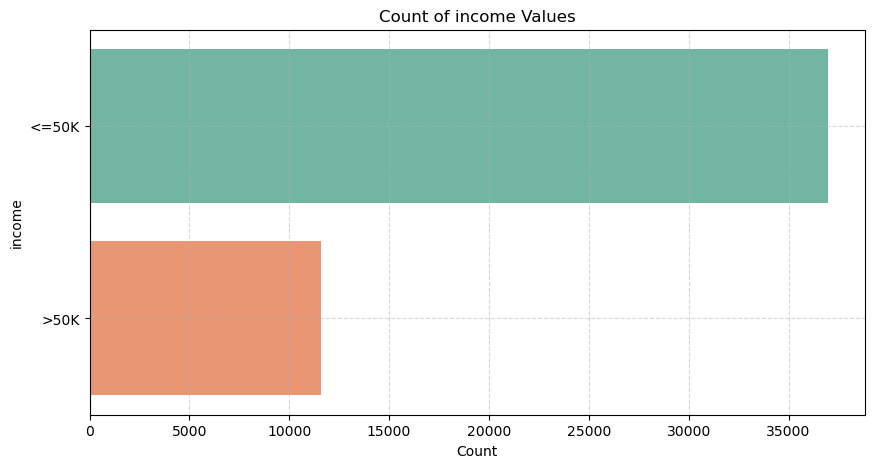

In [42]:
#plotting 'income' column distribution
plot_column_values('income')

<u><h2>Observations :</u></h2>
- “<=50k” constitutes roughly 76% of the data (~37 000 records).
- “>50k” makes up only 24% (~11 600 records).

## Plotting the numerical values

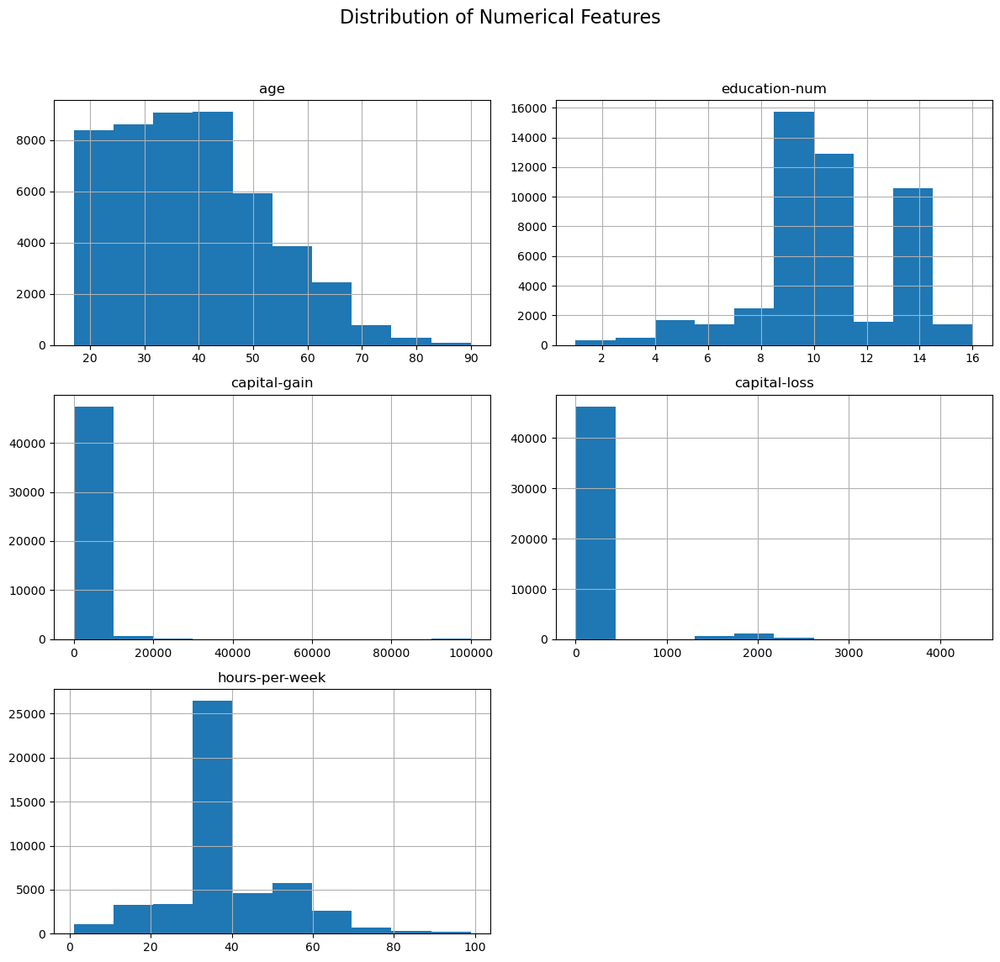

In [43]:
#plotting a histogram for each numerical column in numerical columns to see the distribution of values
df[numerical_columns].hist(
    figsize=(12, 12),

)
plt.suptitle('Distribution of Numerical Features', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the suptitle
plt.show()

<u><h3>Observations :</u></h3>
- People above 8th grade are  dominating the data.
- Capital-gain and Capital loss are distributed mostly around zero.
- More than Half of the people (~52%) are working between 30-40 hours per week.
- The data consists mostly from people at the ages : 18-60.
- Generally, the data is very skewed.

<u><h3>Implications :</u></h3>

- Due to our data being very skewed, we should consider scaling it using standartization/normalization/another scaling algorithm.


# Multivariate plots
### To further understand our data we will use more visualization tools 

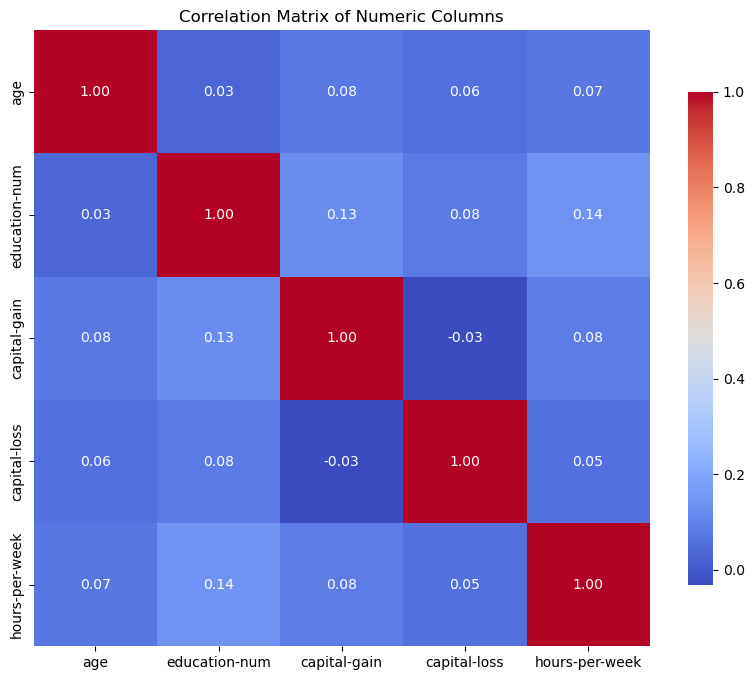

In [44]:
#plotting the correlation matrix of the numeric columns
plt.figure(figsize=(10, 8))
correlation_matrix = df[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Numeric Columns')
plt.show()

<h2><u>Observation</u>:
 No seen correlation between numerical columns.</h2>


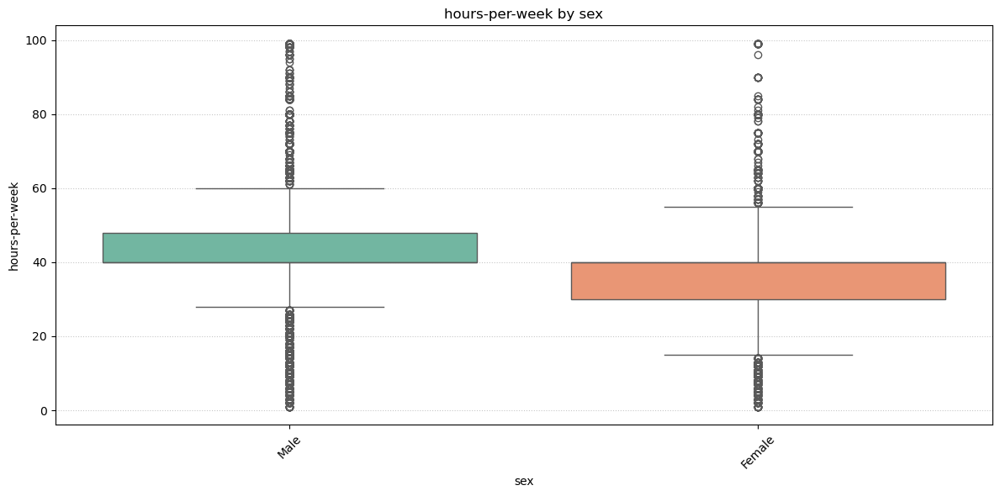

In [45]:
# writing a function for a numerical vs categorical catplot
def Bivariate_catplot(numerical_col, categorical_col, df=df):
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=categorical_col, y=numerical_col, data=df,hue=categorical_col, palette='Set2')
    plt.title(f'{numerical_col} by {categorical_col}')
    plt.xlabel(categorical_col)
    plt.ylabel(numerical_col)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle=':', alpha=0.7)
    plt.tight_layout()
    plt.show()
# Plotting numerical vs categorical features
Bivariate_catplot('hours-per-week', 'sex')




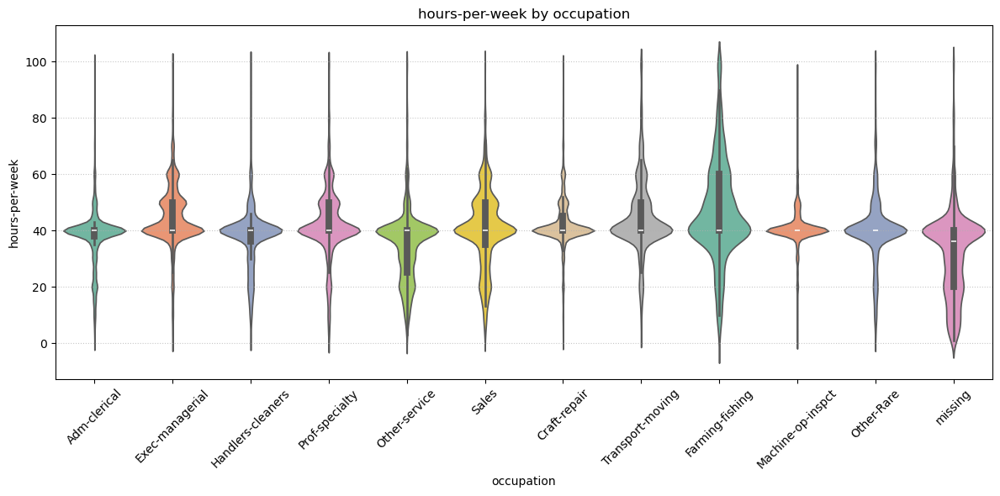

In [46]:
#writing a function to plot Bivariate violin plot
def Bivariate_violinplot(numerical_col, categorical_col, df=df):
    plt.figure(figsize=(12, 6))
    sns.violinplot(x=categorical_col, y=numerical_col, data=df, hue=categorical_col, palette='Set2')
    plt.title(f'{numerical_col} by {categorical_col}')
    plt.xlabel(categorical_col)
    plt.ylabel(numerical_col)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle=':', alpha=0.7)
    plt.tight_layout()
    plt.show()

Bivariate_violinplot('hours-per-week', 'occupation')




<h2><u>Observations:</h2></u>

- 	Feature Engineering
	•	We can  create a new feature called “hour‐type”:
	1.	Part-time (< 30 hrs),
	2.	Full-time (30–45 hrs),
	3.	Overtime (45–60 hrs),
	4.	Extreme (60+ hrs).
	
	•	Then examine how each occupation/workclass falls into these hour‐type buckets. For instance, most Adm-clerical workers would land in “Full-time,” while many Exec-manegerial workers are in “Overtime” or “Extreme.”




In [47]:
#feature engineering - creating new feature called hour-type based on hours-per-week
def hour_type(hours):
    if hours < 30:
        return 'Part-time'
    elif 30 <= hours < 45:  
        return 'Full-time'
    elif 45<= hours <= 60:
        return 'Over-time'
    else:
        return 'Extreme'
# Apply the function to create a new column that categorizes hours-per-week ordinally from part-time to extreme
df['hour-type'] = df['hours-per-week'].apply(hour_type)
#categorize 'hour-type' column ordinally
hour_type_order = ['Part-time','Full-time','Over-time','Extreme']
# Convert 'hour-type' to a categorical type with the specified order
df['hour-type'] = pd.Categorical(df['hour-type'], categories=hour_type_order, ordered=True)


In [48]:
#checking if 'hour-type' column is created and has the correct order
print(df['hour-type'].dtype)
print("Category order:", list(df['hour-type'].cat.categories))

category
Category order: ['Part-time', 'Full-time', 'Over-time', 'Extreme']


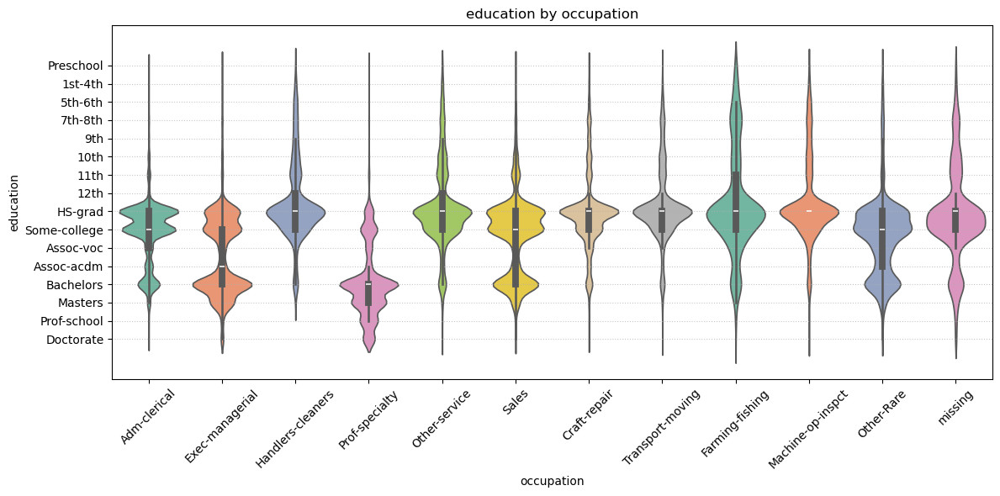

In [49]:
Bivariate_violinplot('education', 'occupation')

<h2><u>Observations:</h2></u>


- Low-education roles (Preschool–12th): Predominantly appear in Handlers-cleaners, Machine-op-inspct, and Transport-moving, with very thin densities in Exec-managerial and Prof-specialty.

- HS-grad: Found across all occupations but peaks in Sales, Other-service, and Adm-clerical, reflecting entry-level or administrative positions.

- Some-college/Associate (Some-college–Assoc-acdm/voc): Concentrated in Private, Exec-managerial, Sales, and Transport-moving, indicating that many mid-level roles require some post-secondary education.

- Bachelor’s or Higher: Densest in Exec-managerial, Prof-specialty, and Protective-serv, with a long right tail into Doctorate at Prof-specialty.

- missing (Unknown education): Sparse noise across all occupations—should be treated as “Unknown” or imputed.

<h2><u>Implications:</h2></u>
Education and occupation correlate strongly:

- Professional/Managerial roles almost exclusively require Bachelor’s or higher.

- Blue-collar/Trade occupations (Machine-op, Handlers, Transport) skew lower (≤ HS or Some-college).

- Service roles (Sales, Other-service) span HS-grad through Bachelor’s.

<u>Feature engineering :</u>

We can encode an education_level feature , then incorporate that alongside occupation to create joint feature interactions:
1. Less than HS : Preschool, 1st-4th, 5th-6th, 7th-8th, 9th, 10th, 11th, 12th
2. HS Graduate : HS-grad
3. Some College / Assoc : Some-college, Assoc-voc, Assoc-acdm.
4. Bachelor’s or Higher : Bachelors, Masters, Prof-school, Doctorate.



## Creating an education-group column as we implied earlier, for Feature engineering purposes.

Text(0.5, 1.0, 'Count of Education Groups')

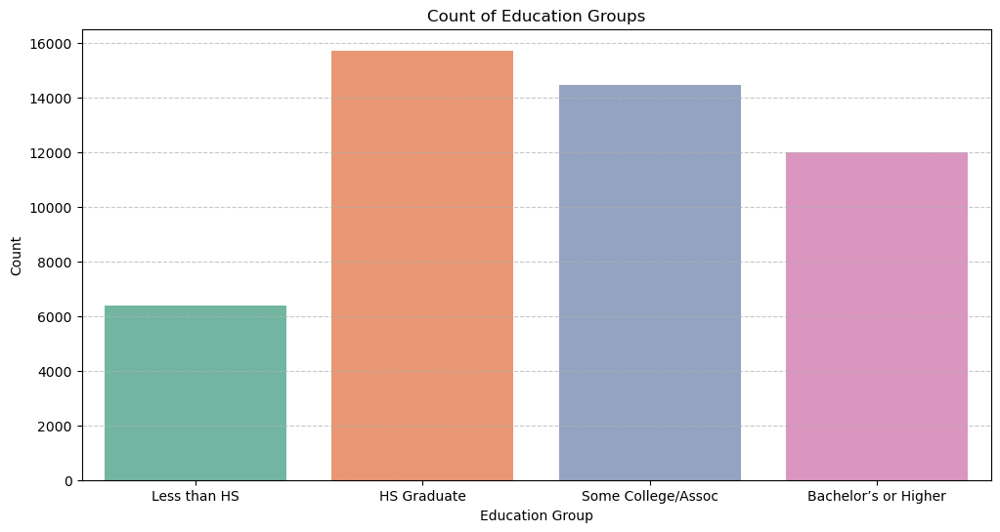

In [50]:
#mapping education levels to education-geoup
education_to_group = {
    # Less than HS
    'Preschool':               'Less than HS',
    '1st-4th':                 'Less than HS',
    '5th-6th':                 'Less than HS',
    '7th-8th':                 'Less than HS',
    '9th':                     'Less than HS',
    '10th':                    'Less than HS',
    '11th':                    'Less than HS',
    '12th':                    'Less than HS',
    # HS Graduate
    'HS-grad':                 'HS Graduate',
    # Some College / Assoc
    'Some-college':            'Some College/Assoc',
    'Assoc-voc':               'Some College/Assoc',
    'Assoc-acdm':              'Some College/Assoc',
    # Bachelor’s or Higher
    'Bachelors':               'Bachelor’s or Higher',
    'Masters':                 'Bachelor’s or Higher',
    'Prof-school':             'Bachelor’s or Higher',
    'Doctorate':               'Bachelor’s or Higher'
}
# Map the education levels to the new groups
df['education-group'] = df['education'].map(education_to_group)
# Convert the new education-group column to a categorical type with an ordinal order
education_group_order = ['Less than HS','HS Graduate','Some College/Assoc', 'Bachelor’s or Higher']
df['education-group'] = pd.Categorical(df['education-group'], categories=education_group_order, ordered=True)

#checking the value counts in the 'education-group' column
plt.figure(figsize=(12, 6))
sns.countplot(x='education-group', data=df, order=education_group_order,hue='education-group', palette='Set2')
plt.xlabel('Education Group')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.title('Count of Education Groups')

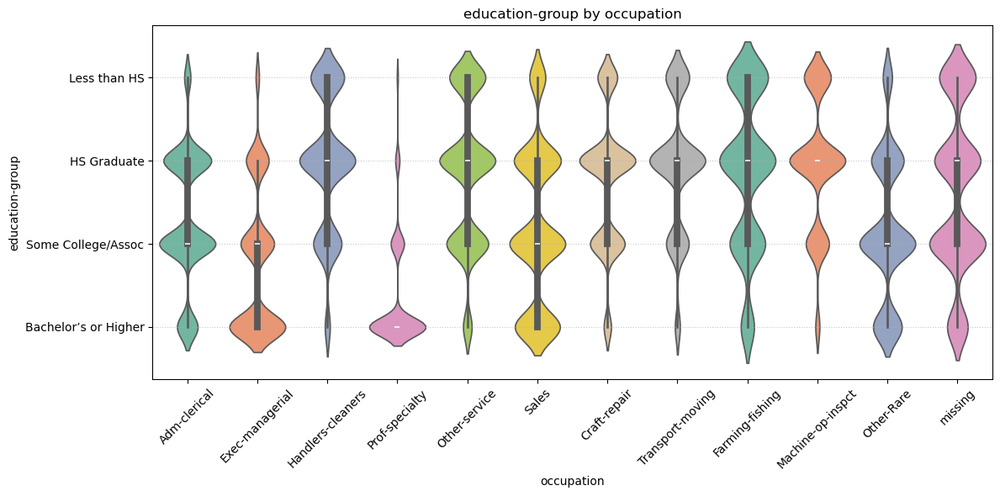

In [51]:
Bivariate_violinplot('education-group', 'occupation')


<h2><u>Observations:</h2></u>

-  Prof-specialty & Exec-managerial: Nearly 100 % “Bachelor’s or Higher,” with almost no “HS Graduate” or below.

- Other-Rare: Broadly mixed across all four education buckets—reflects true heterogeneity.

- Missing education: Lightly scattered in every occupation—worth flagging as its own category.

<h2><u>Implications:</h2></u>

- Occupation–education interactions will sharply separate “high-skill” (Prof-specialty, Exec-managerial + Bachelor’s+) from “mid-skill” (Craft-repair, Adm-clerical + Some College/Assoc) and “low-skill” 

    (Handlers, Machine-op, Farming + < HS/HS) clusters.


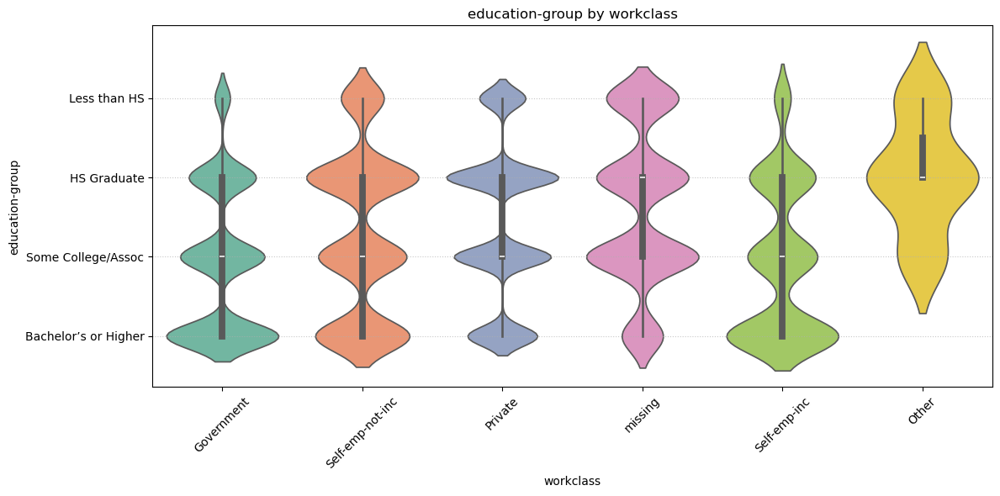

In [52]:
Bivariate_violinplot('education-group', 'workclass')


<h2><u>Observations:</h2></u>

- Self-emp-inc (incorporated business owners) skew heavily toward Bachelor’s or Higher, with substantial density at Masters and some Doctorate, and very few in the <HS categories.
- Government workers have a tight concentration at HS-grad and Bachelors, with a median around HS-grad–Some-college. Very few have below HS or advanced degrees.
- Private sector has 2 peaks : a large peak at HS-grad/Some-college and a second peak at Bachelors, indicating many entry-to-mid-level education roles plus a professional subset.
- Other (Without-pay/Never-worked) is spread across nearly all education levels, peaking at HS-grad but with noise—another sign that this bucket is noisy. 

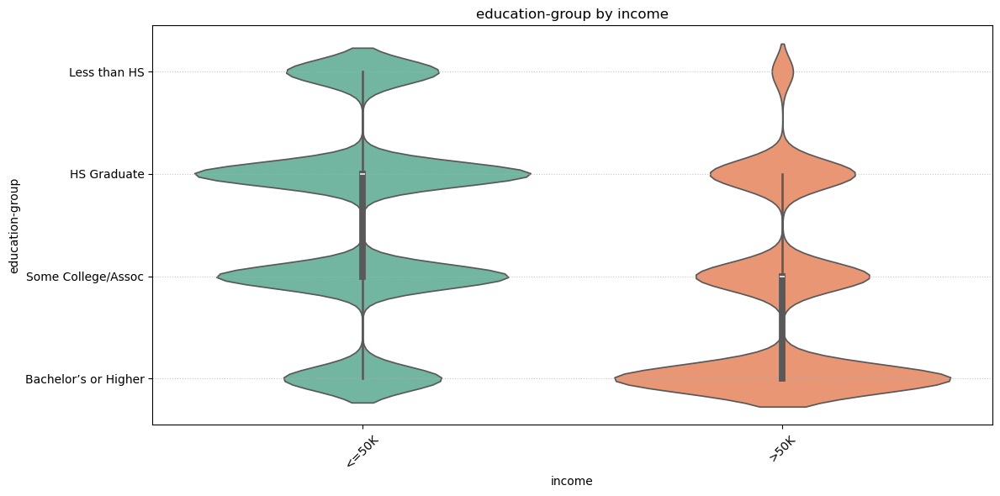

In [53]:
# Plotting numerical vs categorical features using violin plots
Bivariate_violinplot('education-group', 'income')

<h2><u>Observations:</h2></u>

- Low-income (<=50K): The violin is heavily weighted toward HS-grad and Some-college, with a median at HS-grad (9). Minor densities appear at Associate and Bachelor’s levels, but advanced degrees are extremely rare.

- High-income (>50K): The distribution shifts right dramatically. The peak density moves to Bachelors and Masters, with a long tail into Prof-school and Doctorate. The median education level for >50K is around Bachelors (13).

- Gap between groups: There is almost no overlap at the highest education tiers—doctoral and professional school graduates are virtually all in the >50K bracket, while HS-grad and below are almost exclusively <=50K.

<h2><u>Implications:</h2></u>
- <b>Education level is a clear seperator of income classes, can be helpfull for clustering.




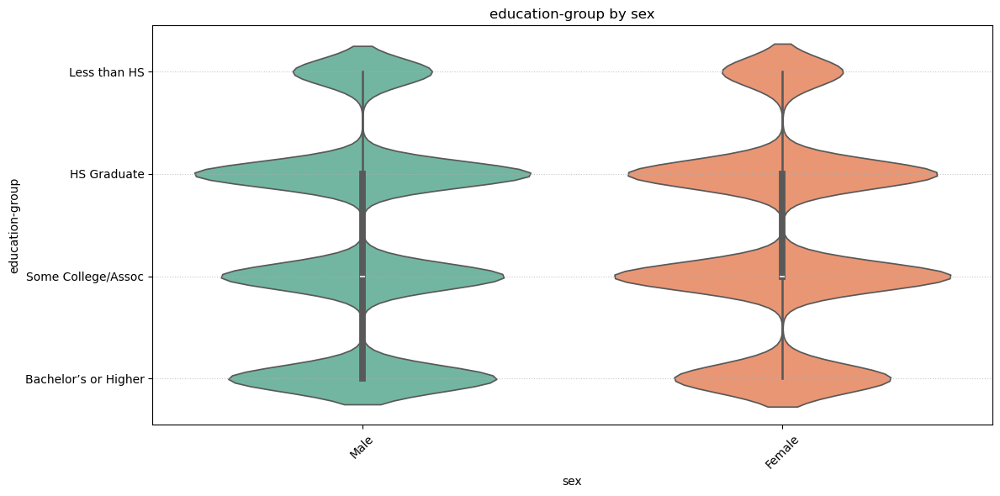

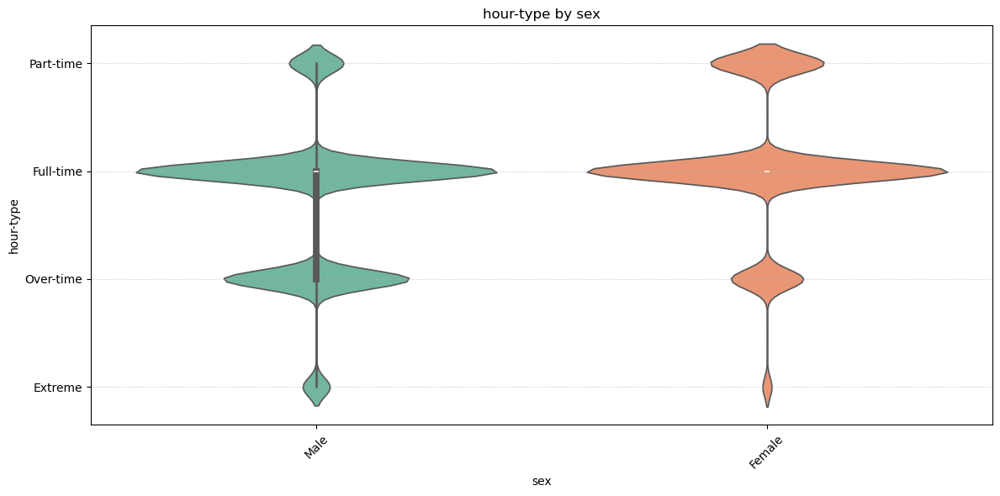

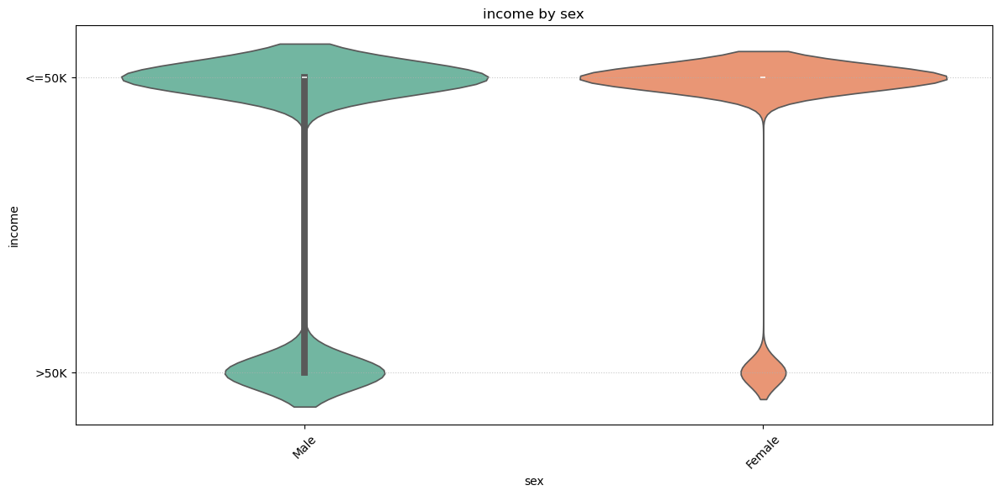

In [54]:
Bivariate_violinplot('education-group', 'sex')
Bivariate_violinplot('hour-type', 'sex')
Bivariate_violinplot('income', 'sex')

<h2><u>Observations:</h2></u>

Education-group by Sex

	•	Women outnumber men in the Some College/Assoc and Bachelor’s+ buckets. Men have a thicker band at HS Graduate.
	
	•	Both sexes show minimal “Less than HS,” but women’s violin is slightly wider there.
	

Hour-type by Sex

	•	Full-time is the dominant category for both, but especially for men.
	•	Women have a noticeably thicker “Part-time” band.
	•	Overtime and Extreme hours appear more frequently among men.

Income by Sex

	•	The vast majority of both sexes earn ≤50 K, with women even more concentrated there.
	•	Men have a relatively larger slice of the >50 K group.


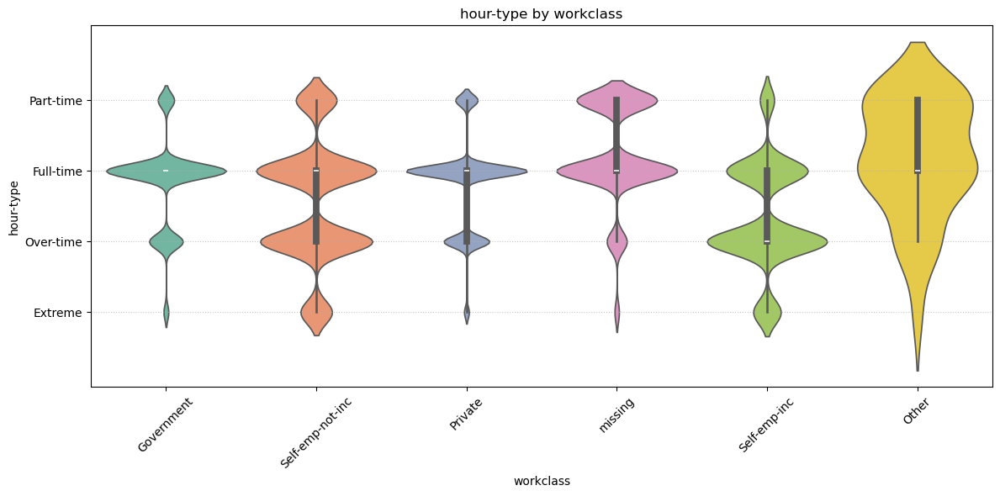

In [55]:
#checking for cluster in the 'workclass' vs hour-type  plot
Bivariate_violinplot('hour-type', 'workclass')

<h2><u>Observations:</h2></u>

- Government: Almost entirely Full-time. The violin is very narrow at Part-time, Over-time, and Extreme, with the median pinned at Full-time.

- Private: Predominantly Full-time, with some Part-time and moderate Over-time, but virtually no Extreme.

- Self-emp-not-inc: Broad distribution across Full-time, Over-time, and some Extreme, indicating varied schedules.

- Self-emp-inc: Right‐skewed with heavy density in Over-time and Extreme, fewer Full-time, minimal Part-time.

- Other (Missing/Without-pay/Never-worked): Highly variable across all bins, suggesting these should be grouped or treated as noisy data.

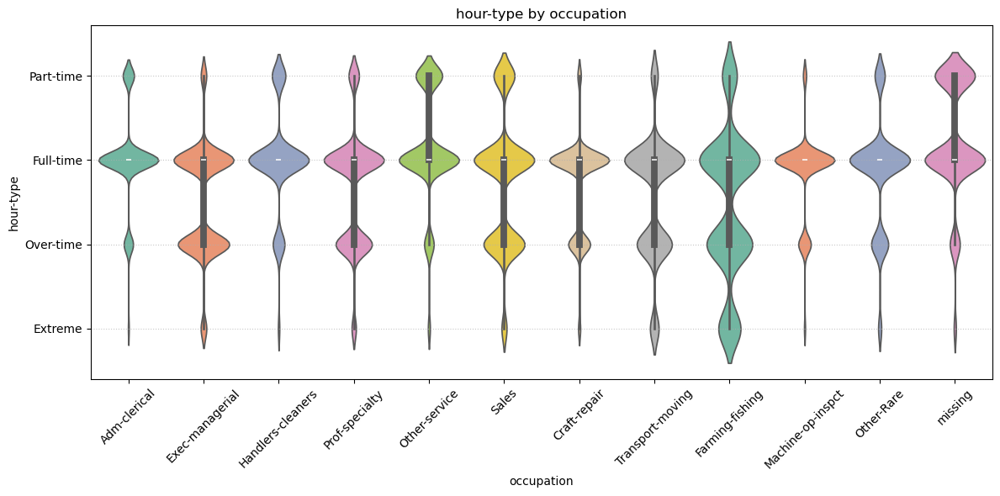

In [56]:
Bivariate_violinplot('hour-type', 'occupation')

<h2><u>Observations:</h2></u>

	1.	Steady 40-hour roles :

	•	Adm-clerical, Handlers-cleaners, Sales, Other-service all show very tight violins around the “Full-time” bin, with only thin slivers of “Part-time” or “Over-time”       and  virtually no “Extreme” outliers.

	2.	Professional/managerial with some long hours :

	•	Exec-managerial and Prof-specialty violins center on “Full-time” but have a noticeable bulge into “Over-time” and even into “Extreme” (60+ hrs), reflecting weekend work or high-responsibility roles.

	3.	Technical/trade mid-tier :

	•	Craft-repair, Machine-op-inspct, Transport-moving: fairly broad spread from “Full-time” into “Over-time,” but only a few points in “Extreme.” This matches shift-work or on-call schedules.

	4.	Seasonal/peak demand :

	•	Farming-fishing: the violin is skewed right, peaking well into “Over-time” and “Extreme.” That seasonal bulge shows bursts of 60–80 hr weeks.

	5.	Catch-all & unknown :

	•	Other-Rare: a very noisy, flat violin spanning all four hour types—this heterogeneous bucket indeed mixes every pattern.
	•	missing: similar full-spectrum noise, confirming these unknown occupations could carry any hour profile.



<h2><u>Implications:</h2></u>


Occupations naturally segment by hour-type:

- Stable 40-hr roles (Adm-clerical, Sales, Other-service, Handlers-cleaners).

- Flexible/overtime roles (Exec-managerial, Prof-specialty, Transport, Farming).

- Noisy/unknown (missing).

- For clustering, we can encode a feature like occupation_group based on these hour-type patterns (“Administrative,” “Professional,” “Trade,” “Agricultural,” “Unknown”).



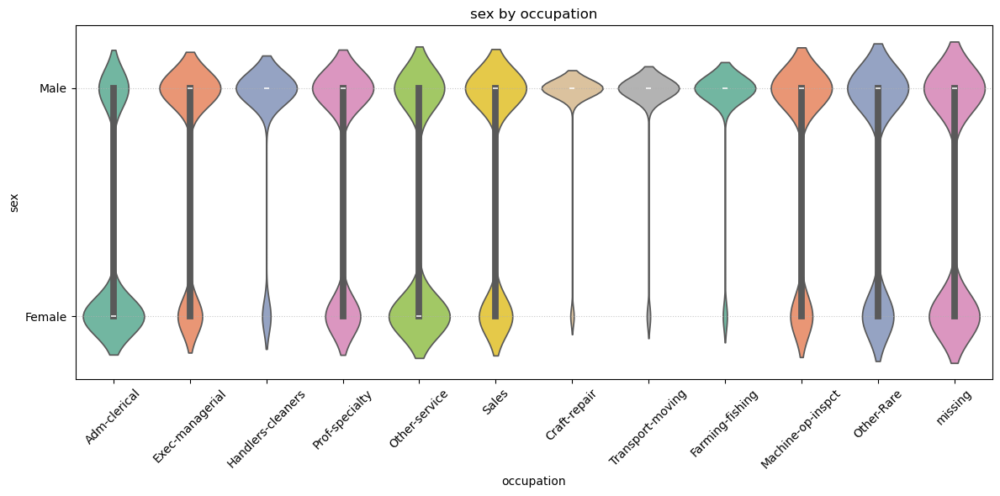

In [57]:
Bivariate_violinplot('sex', 'occupation')

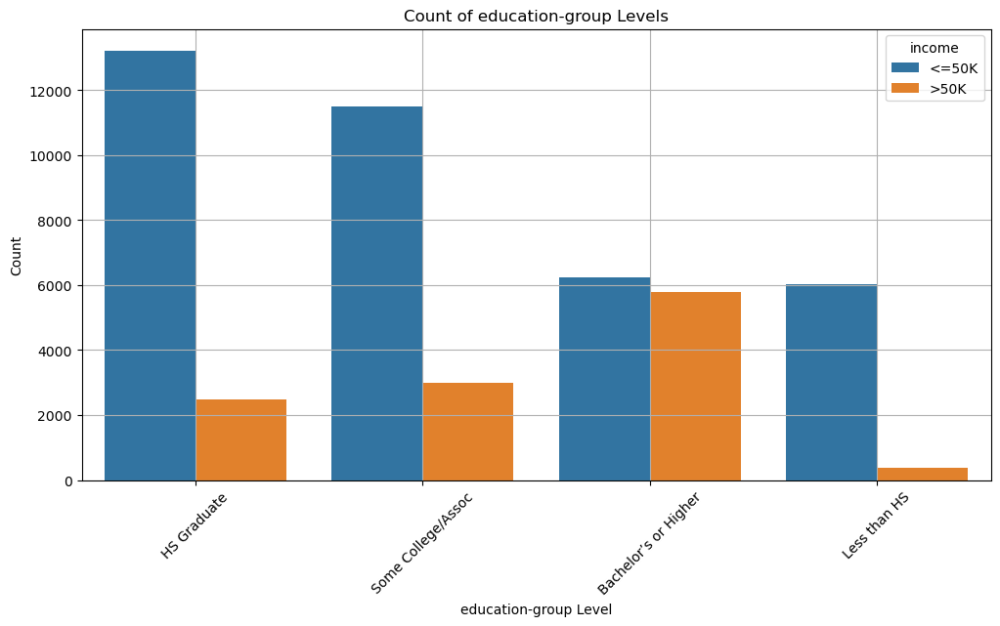

In [58]:
plot_column_distribution('education-group')

<h2><u>Observations:</h2></u>
- We can see a clear correlation between education levels (Group-wise) and the number of records of '>50k'. (Less Than HS < HS Graduate < Some College/Assoc < Bachelor's or Higher)
- Feature engineering: Our four education buckets capture a strong monotonic relationship with income.

<h2><u>Implications:</h2></u>
- Thought - Education as a key segmentation axis: Clusters will naturally separate into “Low-education low-earners,” “Mid-education mixed-earners,” and “High-education high-earners.”

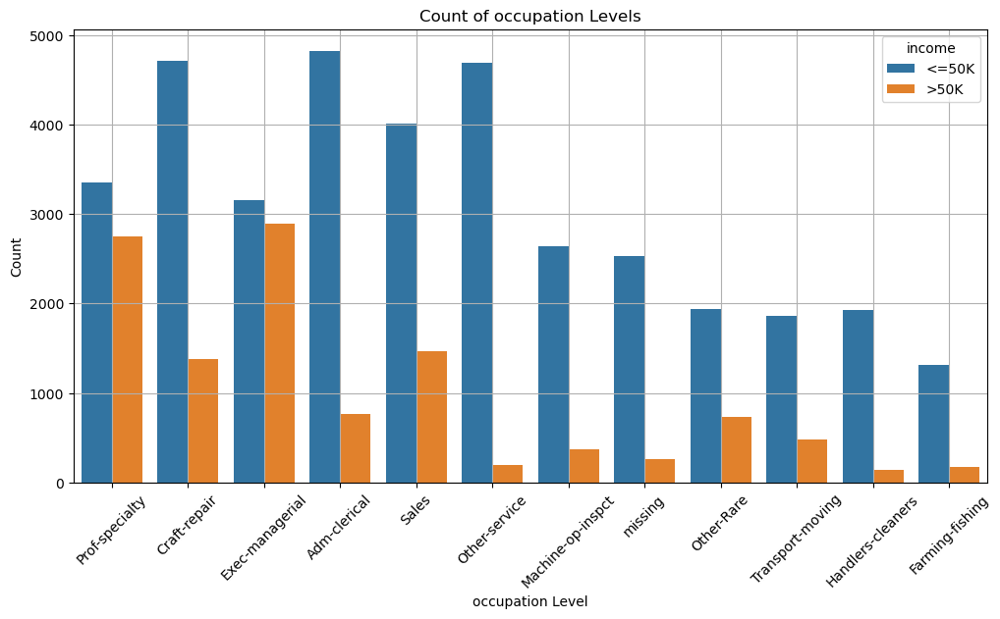

In [59]:
plot_column_distribution('occupation')

<u><h3>Observations : </u></h3>

	•	High-income roles: Exec-managerial and Prof-specialty have the largest >50 K bars (≈2.8 K & 2.7 K) and nearly match their ≤50 K counts—these are almost parity professions.

	•	Mid-income tails: Craft-repair and Adm-clerical still skew heavily ≤50 K but carry meaningful >50 K tails (≈1.4 K and 0.8 K).

	•	Low-income occupations: Machine-op-inspct, Handlers-cleaners, Transport-moving, and Farming-fishing show very few >50 K earners (< 15 %), with their blue bars dwarfing 
	the orange.
	
	•	Mixed/unknown: Sales sits in the middle (≈4 K ≤50 K vs 1.5 K >50 K), while Other-Rare and missing occupations have negligible high-income representation.


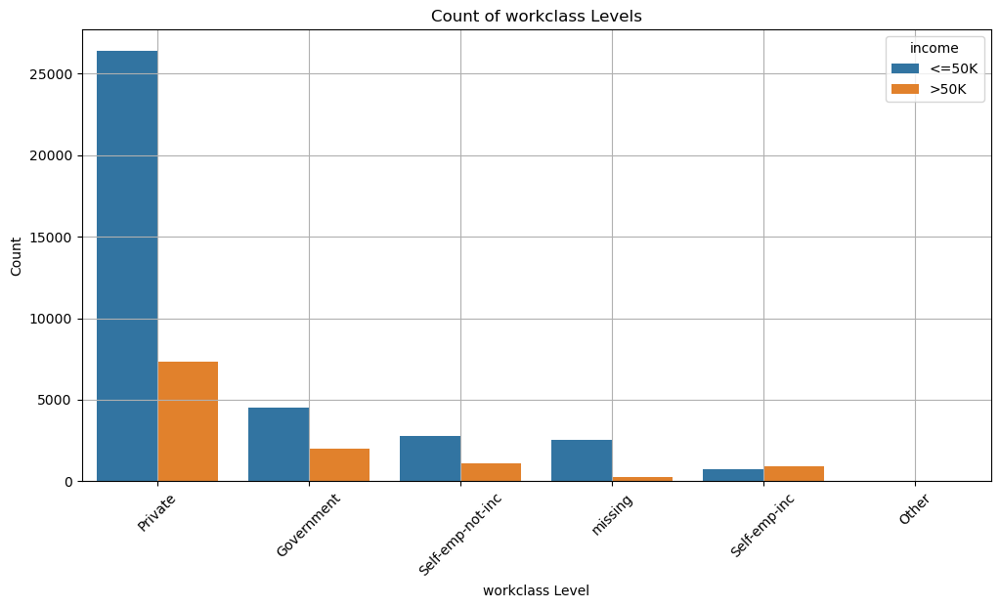

In [60]:
plot_column_distribution('workclass')

# ____________________________________________________________

### Lets calculate the number of outliers using the IQR method and see whether we should drop the outliers

In [61]:
numerical_columns.remove('education-num')  # Remove 'education-num' as it's not needed anymore
numerical_columns.remove('hours-per-week')  # Remove 'hours-per-week' as it's not needed anymore

In [62]:
#lets write a function to calculate the IQR and print the number of outliers
def calculate_iqr_outliers(df, numerical_columns):
    Q1 = df[numerical_columns].quantile(0.25)
    Q3 = df[numerical_columns].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Create a mask for outliers
    outlier_mask = (df[numerical_columns] < lower_bound) | (df[numerical_columns] > upper_bound)
    return outlier_mask

In [63]:
#removing the outliers using the IQR method
print("IQR outliers:\n", calculate_iqr_outliers(df, numerical_columns).sum())
#print the percentage of outliers
outlier_percentage = (calculate_iqr_outliers(df, numerical_columns).sum()/ len(df)) * 100
print("Percentage of outliers in numeric columns:")
print(outlier_percentage.round(2), "%")

IQR outliers:
 age              214
capital-gain    4015
capital-loss    2275
dtype: int64
Percentage of outliers in numeric columns:
age             0.44
capital-gain    8.27
capital-loss    4.68
dtype: float64 %


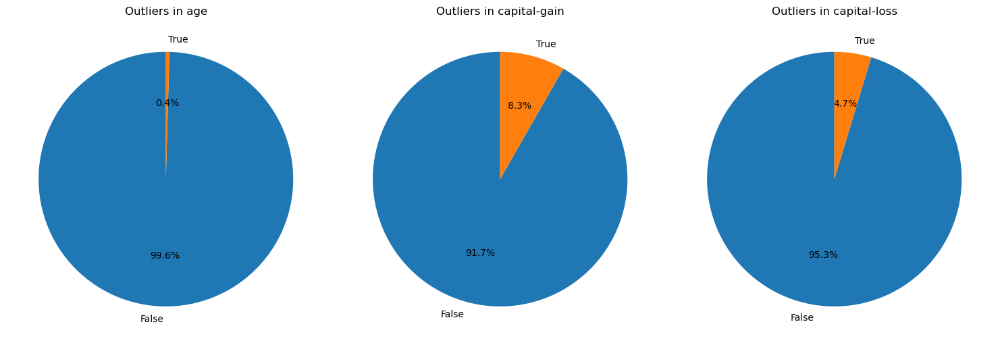

In [64]:
# plotting pie chart for every numeric column to see the distribution of outliers in a subplot
plt.figure(figsize=(15, 10))    
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(2, 3, i)
    outlier_counts = calculate_iqr_outliers(df, numerical_columns)[column].value_counts()
    plt.pie(outlier_counts, labels=outlier_counts.index, autopct='%1.1f%%', startangle=90)
    plt.title(f'Outliers in {column}')
plt.tight_layout()
plt.show()


## We will drop all the outliers thats  less than 10 %


Number of outliers after removal:
 age             25
capital-gain     0
capital-loss     0
dtype: int64 rows


/var/folders/w_/k0tpmcyd4kb_g7x40mz6mbjw0000gn/T/ipykernel_35844/3673770605.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[~outlier_mask['capital-gain'] ]
/var/folders/w_/k0tpmcyd4kb_g7x40mz6mbjw0000gn/T/ipykernel_35844/3673770605.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[~outlier_mask['capital-loss'] ]


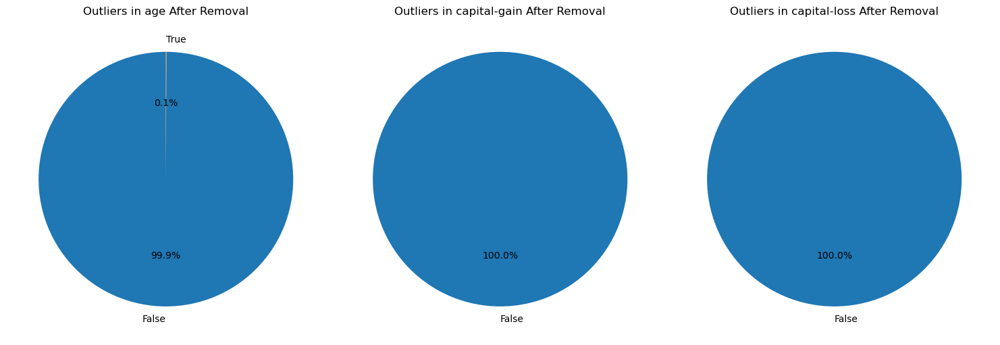

In [65]:
outlier_mask = calculate_iqr_outliers(df, numerical_columns)
#removing the outliers from 'age' 
df = df[~outlier_mask['age'] ]
#removing the outliers from 'capital-gain'
df = df[~outlier_mask['capital-gain'] ]
#removing the outliers from 'capital-loss'
df = df[~outlier_mask['capital-loss'] ]
#checking the outliers again
outlier_mask = calculate_iqr_outliers(df, numerical_columns)
# Display the number of outliers after removal
print("Number of outliers after removal:\n", outlier_mask.sum(), "rows")
#plotting the pie chart for the outliers after removal
plt.figure(figsize=(15, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(2, 3, i)
    outlier_counts = calculate_iqr_outliers(df, numerical_columns)[column].value_counts()
    plt.pie(outlier_counts, labels=outlier_counts.index, autopct='%1.1f%%', startangle=90)
    plt.title(f'Outliers in {column} After Removal')
plt.tight_layout()
plt.show()


# ____________________________________________________________

In [66]:
#encoding income as a binary variable
df['income'] = df['income'].map({'<=50K': 0, '>50K': 1})
df['sex'] = df['sex'].map({'Female': 0, 'Male': 1})


In [67]:
df.head()

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income,hour-type,education-group
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Spouse,White,1,0,0,13,United-States,0,Part-time,Bachelor’s or Higher
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,40,United-States,0,Full-time,HS Graduate
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Spouse,Black,1,0,0,40,United-States,0,Full-time,Less than HS
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Spouse,Black,0,0,0,40,Cuba,0,Full-time,Bachelor’s or Higher
5,37,Private,Masters,14,Married-civ-spouse,Exec-managerial,Spouse,White,0,0,0,40,United-States,0,Full-time,Bachelor’s or Higher


### We will drop the columns the won't be needed for later algrothimns

In [68]:

df.drop(columns=['education-num','education','hours-per-week','education'], inplace=True)

In [69]:

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42106 entries, 1 to 48841
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   age              42106 non-null  int64   
 1   workclass        42106 non-null  object  
 2   marital-status   42106 non-null  object  
 3   occupation       42106 non-null  object  
 4   relationship     42106 non-null  object  
 5   race             42106 non-null  object  
 6   sex              42106 non-null  int64   
 7   capital-gain     42106 non-null  int64   
 8   capital-loss     42106 non-null  int64   
 9   native-country   42106 non-null  object  
 10  income           42106 non-null  int64   
 11  hour-type        42106 non-null  category
 12  education-group  42106 non-null  category
dtypes: category(2), int64(5), object(6)
memory usage: 3.9+ MB


In [70]:
df_copy = df.copy()  # Keep a copy of the DataFrame before scaling

# PCA

In [71]:
# Define the preprocessor with StandardScaler for numerical features and OneHotEncoder for categorical features and binary encoding for 'income' and label encoding for 'hour_type_code' and 'hour_type'
preprocessor = ColumnTransformer([
    ("num", StandardScaler(),    ['age','capital-gain','capital-loss']),
    ("cat", OneHotEncoder(drop='first', sparse_output=False),
             ['workclass','occupation','marital-status','relationship','race','native-country']),
    ("bin", OneHotEncoder(drop='if_binary', sparse_output=False),
         ['income','sex']),
    ("ord", OrdinalEncoder(), ['hour-type','education-group'])
])


In [72]:

def run_pca_pipeline(df, preprocessor, variance_threshold=0.90, plot=True):
    """
    Runs a full PCA workflow on a pre‐specified preprocessing pipeline.

    1. Applies the given preprocessor to the DataFrame.
    2. Fits an unrestricted PCA to inspect explained variance.
    3. Determines the number of components needed to reach the given variance threshold.
    4. Refits PCA with only that many components.
    5. (Optional) Plots a scree chart of individual vs. cumulative variance.
    6. Attaches the first three principal components back to `df` for easy plotting.

    Parameters
    ----------
    df : pandas.DataFrame
        The input DataFrame containing raw features.
    preprocessor : ColumnTransformer (or Pipeline)
        A fitted or unfitted transformer that encapsulates scaling/encoding.
    variance_threshold : float, default=0.90
        The fraction of total variance PCA should capture (e.g. 0.90 → 90%).
    plot : bool, default=True
        Whether to display a scree plot of explained variance.

    Returns
    -------
    X_pca_n : numpy.ndarray, shape (n_samples, n_components)
        The reduced‐dimensional representation of the data.
    pca_n : sklearn.decomposition.PCA
        The PCA instance fitted with `n_components` as determined.
    X_prepped : numpy.ndarray, shape (n_samples, n_raw_features)
        The preprocessed data before PCA.
    """
    # 1) Preprocess the data
    X_prepped = preprocessor.fit_transform(df)

    # 2) Fit full PCA for variance inspection
    pca = PCA()
    pca.fit(X_prepped)
    explained = pca.explained_variance_ratio_
    cum_explained = np.cumsum(explained)

    # 3) Optional scree plot
    if plot:
        plt.figure(figsize=(18, 6))
        plt.plot(np.arange(1, len(explained) + 1), explained, 'o-', label='Individual')
        plt.plot(np.arange(1, len(explained) + 1), cum_explained, 's--', label='Cumulative')
        plt.xlabel('Principal Component')
        plt.ylabel('Explained Variance Ratio')
        plt.title('PCA Scree Plot')
        plt.xticks(np.arange(1, len(explained) + 1))
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # 4) Determine number of components to reach threshold
    n_components = np.searchsorted(cum_explained, variance_threshold) + 1
    print(f"{n_components} components explain ≥{int(variance_threshold * 100)}% of variance")

    # 5) Refit PCA with the selected number of components
    pca_n = PCA(n_components=n_components, random_state=42)
    X_pca_n = pca_n.fit_transform(X_prepped)

    # 6) Add the first three PCs back to the original DataFrame
    df['PC1'] = X_pca_n[:, 0]
    df['PC2'] = X_pca_n[:, 1]
    df['PC3'] = X_pca_n[:, 2]

    return X_pca_n, pca_n, X_prepped


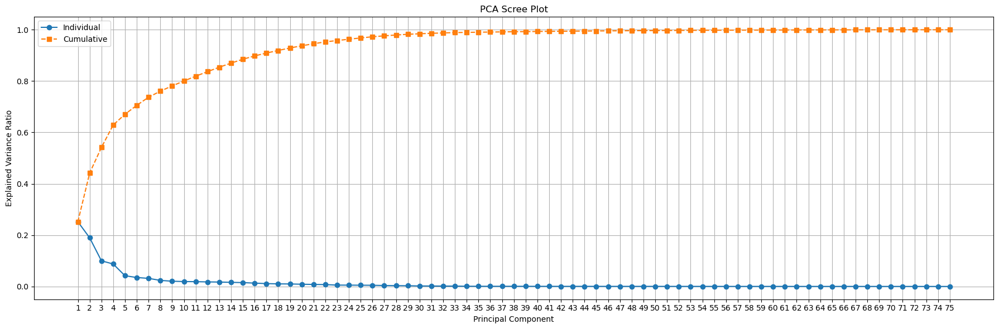

17 components explain ≥90% of variance


In [73]:
#running the PCA function
X_pca_n_90, pca_n_90, X_prepped = run_pca_pipeline(df, preprocessor, variance_threshold=0.90)

<u><h3> Observation :</u></h3>
- 17 Principal Components explain >= 90% of Variance

<u><h3> Implication :</u></h3>
- We will keep 17 components to feed our clustering algorithms.


## To evaluate the best threshold of vairance for our clustering algothims, we will check 4 thresholds and run silhouette scores on them.

In [74]:
for thresh in [0.70, 0.80, 0.85, 0.90]:
    
     # 1) run your PCA → embedding
    X_pca, pca_model, _ = run_pca_pipeline(df, preprocessor, variance_threshold=thresh, plot=False)

    # 2) fit & score KMeans on that embedding
    km = KMeans(n_clusters=4, random_state=42).fit(X_pca)
    labels = km.labels_

    # 3) compute silhouette
    score = silhouette_score(X_pca, labels, metric='euclidean')

    # 4) count how many clusters we actually got
    n_clusters = len(np.unique(labels))

    print(
        f"{int(thresh*100)}% var → {X_pca.shape[1]} PCs  "
        f"→ silhouette {score:.3f}"
    )

6 components explain ≥70% of variance
70% var → 6 PCs  → silhouette 0.236
10 components explain ≥80% of variance
80% var → 10 PCs  → silhouette 0.195
13 components explain ≥85% of variance
85% var → 13 PCs  → silhouette 0.179
17 components explain ≥90% of variance
90% var → 17 PCs  → silhouette 0.165


### We will choose 80% variance which means 10 PCs, which will give us a silhouette score of 0.195 for 4 clusters.


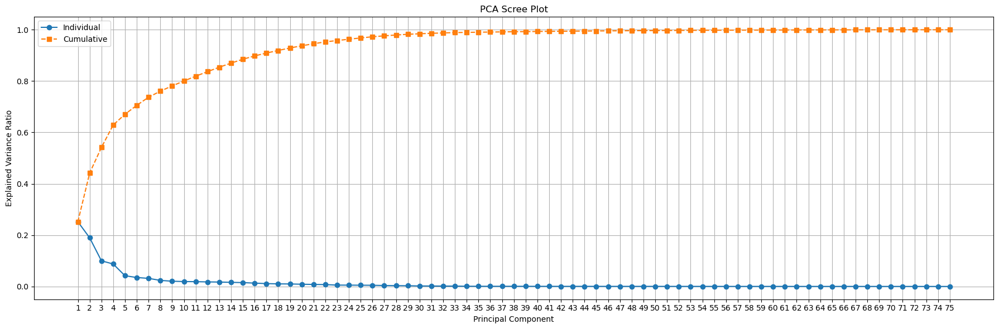

10 components explain ≥80% of variance


In [75]:
X_pca_n_80, pca_n_80, X_prepped = run_pca_pipeline(df,preprocessor,0.80)

# t-SNE

In [76]:
#visualizing the PCA results using  t-SNE
X_tsne = TSNE(n_components=3, random_state=42).fit_transform(X_pca_n_80)

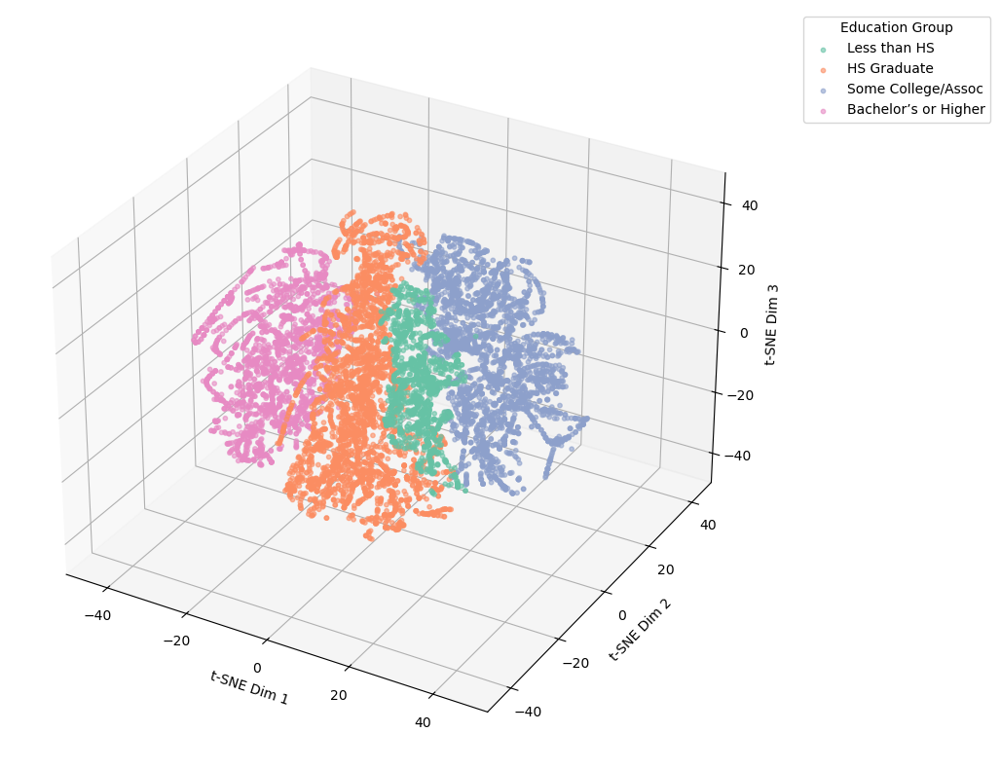

In [77]:
df['TSNE1'], df['TSNE2'], df['TSNE3'] = X_tsne[:,0], X_tsne[:,1],X_tsne[:,2]
#plotting a 3-d scatter plot using seaborn of the t-SNE results

# (Optionally) down-sample to, say, 5 000 points to reduce over-plotting
plot_df = df.sample(n=10000, random_state=42)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Draw each education group separately so we get a proper legend
for lvl, color in zip(
        plot_df['education-group'].cat.categories,
        sns.color_palette('Set2', n_colors=plot_df['education-group'].nunique())
    ):
    mask = plot_df['education-group'] == lvl
    ax.scatter(
        plot_df.loc[mask, 'TSNE1'],
        plot_df.loc[mask, 'TSNE2'],
        plot_df.loc[mask, 'TSNE3'],
        label=lvl,
        color=color,
        s=10,
        alpha=0.6
    )

# Axis labels
ax.set_xlabel('t-SNE Dim 1')
ax.set_ylabel('t-SNE Dim 2')
ax.set_zlabel('t-SNE Dim 3')

# Legend outside the plot
ax.legend(title='Education Group', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [78]:

fig = px.scatter_3d(
    plot_df,
    x='TSNE1', y='TSNE2', z='TSNE3',
    color='education-group',
    title='Interactive 3D t-SNE of PCA Results',
    width=800, height=700,
    opacity=0.7
)
fig.update_traces(marker=dict(size=4))
fig.show()

# K-means

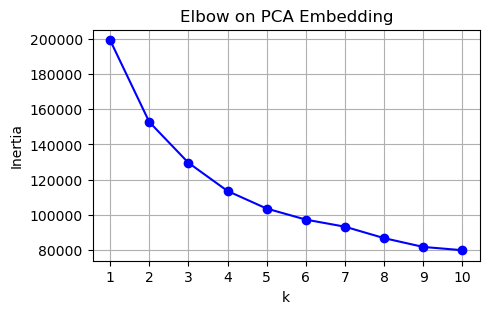

In [79]:
def plot_pca_elbow(
    X, 
    k_min=1, 
    k_max=10, 
    random_state=42, 
    figsize=(5, 3), 
    marker='bo-'
):
    """
    Plots an elbow curve of k-means inertia on PCA-transformed data.

    Parameters
    ----------
    X : array-like of shape (n_samples, n_features)
        PCA-transformed embedding.
    k_min : int, default=1
        Minimum number of clusters to test.
    k_max : int, default=10
        Maximum number of clusters to test.
    random_state : int, default=42
        Random seed for reproducibility.
    figsize : tuple, default=(5, 3)
        Figure size for the plot.
    marker : str, default='bo-'
        Marker and line style for the plot.

    Returns
    -------
    inertias : list of float
        Inertia values for each k in the range [k_min, k_max].
    """
    inertias = []
    Ks = range(k_min, k_max + 1)
    for k in Ks:
        km = KMeans(n_clusters=k, random_state=random_state).fit(X)
        inertias.append(km.inertia_)

    plt.figure(figsize=figsize)
    plt.plot(list(Ks), inertias, marker)
    plt.xlabel('k')
    plt.ylabel('Inertia')
    plt.title('Elbow on PCA Embedding')
    plt.xticks(list(Ks))
    plt.grid(True)
    plt.show()

    return inertias

pca_elbow = plot_pca_elbow(X_pca_n_80)

<u><h3> Observation :</u></h3>
- k = 3 is our best_k according to the elbow method. hence we will use it.

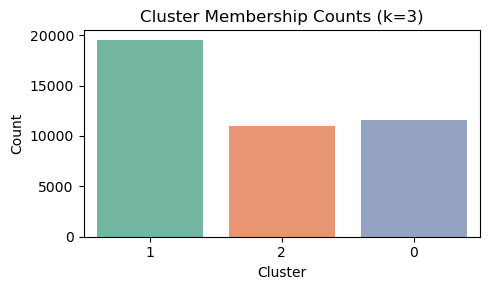

In [80]:
# Choose k based on 'elbow method' 
best_k = 3

# Fit K-Means on the PCA embedding (X_pca_n_80)
km = KMeans(n_clusters=best_k, random_state=42)
km.fit(X_pca_n_80)
labels = km.labels_

#  Attach the cluster labels to our DataFrame
df['cluster'] = labels.astype(str)    # as str for a categorical hue


# Function to plot cluster sizes
def plot_cluster_sizes(df, cluster_col='cluster', k=None):
    plt.figure(figsize=(5,3))
    sns.countplot(x=cluster_col, data=df,hue=cluster_col, palette='Set2')
    title = f"Cluster Membership Counts"
    if k is not None:
        title += f" (k={k})"
    plt.title(title)
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

# Plot cluster sizes
plot_cluster_sizes(df, cluster_col='cluster', k=best_k)



In [81]:
# We want tp save a list of all the columns in the DataFrame for future reference
columns = [
    'age',
    'workclass',
    'marital-status',
    'occupation',
    'relationship',
    'race',
    'sex',
    'capital-gain',
    'capital-loss',
    'native-country',
    'income',
    'hour-type',
    'education-group'
]

In [ ]:
def cluster_profiles_mode(df, group_col='cluster', cols=None):
    """
    Profiles each group in a DataFrame by computing the mode of specified columns.

    Parameters
    ----------
    df : pandas.DataFrame
        The input DataFrame containing the group and target columns.
    group_col : str, default='cluster'
        The column name to group by (e.g., cluster labels).
    cols : list of str, optional
        List of column names to profile. If None, defaults to all columns except group_col.

    Returns
    -------
    summary_df : pandas.DataFrame
        Summary DataFrame where each row corresponds to a group and each column
        contains the mode of that feature within the group.
    """
    
    if cols is None:
        cols = [c for c in columns]
    grouped = df.groupby(group_col)
    summary = {
        col: grouped[col].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
        for col in cols
    }
    return pd.DataFrame(summary)



In [83]:
def cluster_profiles(df, group_col='cluster', cols=None):
    """
    Profiles each group in a DataFrame:
      • For numeric columns → mean, median, and mode
      • For non-numeric columns → mode only

    Parameters
    ----------
    df : pandas.DataFrame
        The input DataFrame containing group labels & features.
    group_col : str
        Column name to group by (e.g. cluster labels).
    cols : list[str] or None
        Which columns to profile; defaults to all except group_col.

    Returns
    -------
    pandas.DataFrame
        One row per group, columns like 'age_mean', 'age_median',
        'age_mode', 'workclass_mode', etc.
    """
    if cols is None:
        cols = [c for c in df.columns if c != group_col]

    grouped = df.groupby(group_col)
    out = {}

    for col in cols:
        kind = df[col].dtype.kind  # 'i','u','f','b','c' are numeric
        if kind in ('b','i','u','f','c'):
            # numeric: mean, median, mode
            out[f"{col}_mean"]   = grouped[col].mean()
            out[f"{col}_median"] = grouped[col].median()
            out[f"{col}_mode"]   = grouped[col] \
                                       .agg(lambda x: x.mode().iat[0]
                                            if not x.mode().empty else np.nan)
        else:
            # non-numeric: only mode
            out[f"{col}_mode"]   = grouped[col] \
                                       .agg(lambda x: x.mode().iat[0]
                                            if not x.mode().empty else np.nan)

    summary_df = pd.concat(out, axis=1)
    summary_df.index.name = group_col
    return summary_df

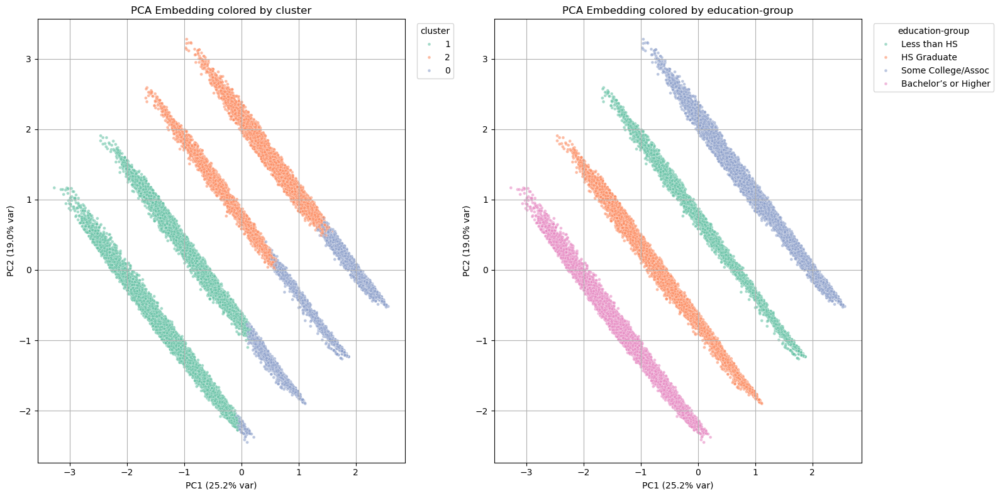

In [84]:
def plot_pca_clusters(df, pca, hue1_col='cluster', hue2_col=None):
    """
    Creates a 2D scatter visualization of the first two principal components,
    coloring points by one or two categorical variables.

    If `hue2_col` is provided, creates side-by-side subplots:
      - Left: Hue = `hue1_col` (e.g., cluster labels)
      - Right: Hue = `hue2_col` (e.g., education group)
    If `hue2_col` is None, only the left plot is shown.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'PC1' and 'PC2' columns plus the hue columns.
    pca : sklearn.decomposition.PCA
        Fitted PCA object used to compute explained_variance_ratio_ for axis labels.
    hue1_col : str, default='cluster'
        Column name in `df` to use for the left subplot’s color mapping.
    hue2_col : str or None, default=None
        Column name in `df` to use for the right subplot’s color mapping. If None, only one plot is shown.
    """
    if hue2_col is not None:
        plt.figure(figsize=(16, 8))
        n_plots = 2
    else:
        plt.figure(figsize=(8, 6))
        n_plots = 1

    # Left: color by first hue
    plt.subplot(1, n_plots, 1)
    sns.scatterplot(
        x='PC1', y='PC2',
        hue=hue1_col,
        palette='Set2',
        data=df,
        s=12, alpha=0.6
    )
    plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
    plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
    plt.title(f"PCA Embedding colored by {hue1_col}")
    plt.legend(title=hue1_col, bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.grid(True)

    # Right: color by second hue, if provided
    if hue2_col is not None:
        plt.subplot(1, n_plots, 2)
        sns.scatterplot(
            x='PC1', y='PC2',
            hue=hue2_col,
            palette='Set2',
            data=df,
            s=12, alpha=0.6
        )
        plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
        plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
        plt.title(f"PCA Embedding colored by {hue2_col}")
        plt.legend(title=hue2_col, bbox_to_anchor=(1.02, 1), loc='upper left')
        plt.grid(True)

    plt.tight_layout()
    plt.show()

# Call the function
plot_pca_clusters(df, pca_n_90,'cluster', 'education-group')

# Observation :
- PC1 is almost perfectly ordered by education, so the left-to-right layout in 2D looks like four distinct stripes.

In [ ]:
summary_df = cluster_profiles_mode(df)
summary_df

,age_mean,age_median,age_mode,workclass_mode,marital-status_mode,occupation_mode,relationship_mode,race_mode,sex_mean,sex_median,sex_mode,capital-gain_mean,capital-gain_median,capital-gain_mode,capital-loss_mean,capital-loss_median,capital-loss_mode,native-country_mode,income_mean,income_median,income_mode,hour-type_mode,education-group_mode,PC1_mean,PC1_median,PC1_mode,PC2_mean,PC2_median,PC2_mode,PC3_mean,PC3_median,PC3_mode,TSNE1_mean,TSNE1_median,TSNE1_mode,TSNE2_mean,TSNE2_median,TSNE2_mode,TSNE3_mean,TSNE3_median,TSNE3_mode
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,24.115039,23.0,20,Private,Never-married,Other-service,Own-child,White,0.539067,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.005445,0.0,0,Full-time,Some College/Assoc,1.343970,1.522353,1.809610,-0.616763,-0.448775,-1.210516,0.103368,-0.360570,1.343582,16.351772,16.009075,37.243084,-6.232286,-5.146678,-16.647549,2.156698,0.510037,10.570667
1,41.890643,41.0,35,Private,Married-civ-spouse,Prof-specialty,Spouse,White,0.695449,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.284719,0.0,0,Full-time,HS Graduate,-1.026317,-0.983794,-0.610417,-0.367926,-0.341592,-0.100837,-0.009321,-0.157624,-0.787918,-13.654984,-13.446375,-2.037278,-6.079434,-6.489152,10.866085,-0.046700,0.387445,-21.108980
2,44.799401,44.0,38,Private,Married-civ-spouse,Craft-repair,Spouse,White,0.701506,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.214208,0.0,0,Full-time,Some College/Assoc,0.406262,0.474373,0.447778,1.298825,1.264176,1.336455,-0.092006,-0.222987,-0.813915,7.347604,7.125629,6.152226,16.938318,17.223885,21.073921,-1.532895,-1.598206,-27.599636


### We want to further investigate our clusters, hence we will look at the top 5 values in each column of the cluster and see if we can get insights from it.

In [86]:
# 1) slice out cluster 1
cluster_1 = df[df['cluster']=='1']

# 2) for each column, print the top 5 values + counts
for col in columns:
    print(f"--- {col} ---")
    print(cluster_1[col].value_counts().head(5), "\n")


--- age ---
age
35    684
36    668
37    644
33    642
38    632
Name: count, dtype: int64 

--- workclass ---
workclass
Private             12946
Government           3248
Self-emp-not-inc     1798
Self-emp-inc          763
missing               752
Name: count, dtype: int64 

--- marital-status ---
marital-status
Married-civ-spouse    10943
Never-married          3859
Divorced               3113
Widowed                 696
Separated               635
Name: count, dtype: int64 

--- occupation ---
occupation
Prof-specialty     3749
Exec-managerial    3020
Craft-repair       2421
Sales              2103
Adm-clerical       2022
Name: count, dtype: int64 

--- relationship ---
relationship
Spouse            10820
Not-in-family      5266
Unmarried          2031
Own-child           984
Other-relative      413
Name: count, dtype: int64 

--- race ---
race
White                 16991
Black                  1557
Asian-Pac-Islander      696
Other-Race              270
Name: count, dtype: int6

## Cluster 1: Mid-career Professionals & Managers
<u><h3> Observations: </u></h3>

	•	Age: concentrated in mid-30s (33–38).

	•	Marital & Family: 10,820 “Spouse” relationships and 10,943 married-civil-spouse.

	•	Occupation & Education: top roles are Prof-specialty (3,749) and Exec-managerial (3,020); education is split between HS-grad (10,288) and Bachelor’s+ (9,226).

	•	Income: ~28 % earn > 50 K (5,556 of 19,514).

	•	Workclass & Hours: mostly Private (12,946) or Government (3,248), heavy full-time (11,726) and overtime (5,508).

<u><h3>Implications:</u></h3>

	•	This is the “core” professional segment—stable careers, family households, moderate to high incomes.

	•	They’re prime candidates for premium financial products or advanced training.

	•	Clustering labels like “High-skill Professional” fit this group well.

In [87]:
cluster_0 = df[df['cluster'] == '0']
for col in columns:
    print(f"--- {col} ---")
    print(cluster_0[col].value_counts().head(5), "\n")

--- age ---
age
20    1037
19     996
21     992
22     974
23     931
Name: count, dtype: int64 

--- workclass ---
workclass
Private             9180
missing             1154
Government           824
Self-emp-not-inc     303
Self-emp-inc          95
Name: count, dtype: int64 

--- marital-status ---
marital-status
Never-married         10282
Divorced                598
Separated               302
Married-civ-spouse      232
Other                   139
Name: count, dtype: int64 

--- occupation ---
occupation
Other-service    2217
Adm-clerical     1747
Sales            1534
missing          1163
Craft-repair     1027
Name: count, dtype: int64 

--- relationship ---
relationship
Own-child         5942
Not-in-family     3557
Unmarried         1166
Other-relative     771
Spouse             134
Name: count, dtype: int64 

--- race ---
race
White                 9478
Black                 1501
Asian-Pac-Islander     311
Other-Race             280
Name: count, dtype: int64 

--- sex ---
sex

## Cluster 0: Young / Early-career Group
<u><h3> Observations: </u></h3>

	•	Age: overwhelmingly 19–23.

	•	Relationship: 5,942 “Own-child” and 3,557 “Not-in-family” – lots of dependents or very young adults.

	•	Education: “Some College/Assoc” (5,073) and “HS Graduate” (3,760) dominate, with 2,580 “<HS.”

	•	Income: virtually no one > 50 K (63 of ~11 570), so nearly 100 % low earners.

	•	Work & Hours: mostly Private or Government, heavy part-time (3,088) and full-time (6,921), very little overtime/extreme.

<u><h3>Implications:</u></h3>

	•	This cluster is primarily minors or early-career individuals with limited earning power.
	
	•	Upskilling or educational interventions could shift many into higher-earning clusters.

In [88]:
cluster_2 = df[df['cluster'] == '2']
for col in columns:
    print(f"--- {col} ---")
    print(cluster_2[col].value_counts().head(7), "\n")

--- age ---
age
38    393
37    389
41    386
42    378
36    374
40    361
46    355
Name: count, dtype: int64 

--- workclass ---
workclass
Private             7478
Government          1495
Self-emp-not-inc    1103
missing              557
Self-emp-inc         382
Other                  7
Name: count, dtype: int64 

--- marital-status ---
marital-status
Married-civ-spouse    6933
Divorced              2198
Never-married          688
Widowed                562
Separated              460
Other                  181
Name: count, dtype: int64 

--- occupation ---
occupation
Craft-repair         1895
Exec-managerial      1301
Adm-clerical         1269
Sales                1062
Other-service        1048
Machine-op-inspct     846
Other-Rare            804
Name: count, dtype: int64 

--- relationship ---
relationship
Spouse            6863
Not-in-family     2258
Unmarried         1482
Own-child          221
Other-relative     198
Name: count, dtype: int64 

--- race ---
race
White            

## Cluster 2: Mid-career Technical & Trade

<u><h3> Observations: </u></h3>

	•	Age: centered on late 30s to early 40s (36–42).

	•	Occupation: Craft-repair (1,895), Exec-managerial (1,301), Adm-clerical (1,269), Sales (1,062).

	•	Education: overwhelmingly “Some-College/Assoc” (7,749) and “<HS” (3,273), no HS-grad or Bachelor’s+ in top five.

	•	Income: ~21 % earn > 50 K (2,361 of 11,022).

	•	Workclass & Hours: mostly Private (7,478) or Government (1,495), strong full-time (7,061) and overtime (2,569).


<u><h3>Implications:</u></h3>

	•	This cluster reflects seasoned trades and mid-level service roles with post-secondary certificates.

	•	There’s clear upside potential: targeted upskilling (e.g. technical certifications) could boost many into the Cluster 1 profile.

	•	Labeling it “Technical / Service Mid-Skill” to highlight its blend of trade and administrative jobs.

In [89]:
def plot_pca_3d_clusters(df, cluster_col='hc_cluster', sample_n=10000, random_state=42):
    """
    Plots an interactive 3D scatter plot of PCA results colored by cluster.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'PC1', 'PC2', 'PC3', and cluster columns.
    cluster_col : str, default='hc_cluster'
        Column name for cluster labels.
    sample_n : int, default=5000
        Number of samples to plot for better performance.
    random_state : int, default=42
        Random seed for reproducibility.

    Returns
    -------
    None
        Displays the interactive 3D plot.
    """
    plot_df = df.sample(n=sample_n, random_state=random_state)
    fig = px.scatter_3d(
        plot_df,
        x='PC1', y='PC2', z='PC3',
        color=cluster_col,
        title='Interactive 3D of PCA Results',
        width=800, height=700,
        opacity=0.7
    )
    fig.update_traces(marker=dict(size=4))
    fig.show()


In [90]:
plot_pca_3d_clusters(df,'cluster', sample_n=10000, random_state=42)

In [91]:
def plot_tsne_clusters(plot_df, hue1_col='cluster', hue2_col=None):
    """
    Creates one or two interactive 3D t-SNE scatter plots for visualizing cluster structure and optionally another variable.

    The first plot colors points by the specified cluster labels, helping you assess how clusters separate in t-SNE space.
    If `hue2_col` is provided, a second plot is shown coloring by that column (e.g., education group).

    Parameters
    ----------
    plot_df : pandas.DataFrame
        DataFrame containing the t-SNE coordinates ('TSNE1', 'TSNE2', 'TSNE3') plus the hue columns.
    hue1_col : str, default='cluster'
        Column name in `plot_df` to color the first 3D scatter (e.g., cluster labels).
    hue2_col : str or None, default=None
        Column name in `plot_df` to color the second 3D scatter (e.g., education buckets).

    Returns
    -------
    None
        Displays one or two interactive Plotly 3D scatter plots.
    """
    # Plot clusters by cluster label
    fig1 = px.scatter_3d(
        plot_df,
        x='TSNE1', y='TSNE2', z='TSNE3',
        color=hue1_col,
        title='Interactive 3D of T-SNE Results',
        width=800, height=700,
        opacity=0.7
    )
    fig1.update_traces(marker=dict(size=4))
    fig1.show()

    # Plot clusters by second hue if provided
    if hue2_col is not None:
        fig2 = px.scatter_3d(
            plot_df,
            x='TSNE1', y='TSNE2', z='TSNE3',
            color=hue2_col,
            title=f'Interactive 3D of T-SNE Results by {hue2_col}',
            width=800, height=700,
            opacity=0.7
        )
        fig2.update_traces(marker=dict(size=4))
        fig2.show()

# Example usage:
plot_tsne_clusters(df,'cluster', 'education-group')



# Compute Silhouette Scores

In [92]:
# compute silhouette score
silhouette_avg = silhouette_score(X_pca_n_80, df['education-group'].cat.codes)
print(f"Silhouette Score for k={best_k}: {silhouette_avg:.3f}")


Silhouette Score for k=3: 0.096


# Observation :
- We got a very low Silhouette Score , meanning the data doesnt cluster well according to 'education-group', hence we will check the Silhouette Score with cluster label

In [93]:
silhouette_avg = silhouette_score(X_pca_n_80, labels)
print(f"Silhouette Score for k={best_k}: {silhouette_avg:.3f}")

Silhouette Score for k=3: 0.203


## We got Silhouette Score of 0.203 for 3 clusters, which is considered not good. We will try to recompute the score for k = 2 - 4 to see if we can get a better score.

k=2 : silhouette=0.224
k=3 : silhouette=0.203
k=4 : silhouette=0.195
k=5 : silhouette=0.199
k=6 : silhouette=0.197
k=7 : silhouette=0.177
k=8 : silhouette=0.200
k=9 : silhouette=0.197
k=10 : silhouette=0.180


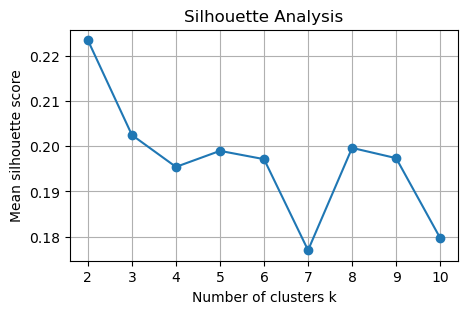

In [94]:
Ks = [2, 3, 4, 5, 6, 7, 8, 9, 10]
sil_scores = []

for k in Ks:
    # 1) Fit K-Means for this k
    km     = KMeans(n_clusters=k, random_state=42).fit(X_pca_n_80)
    labels = km.labels_
    
    # 2) Compute the silhouette score on the same embedding + labels
    score  = silhouette_score(X_pca_n_80, labels, metric='euclidean')
    sil_scores.append(score)
    print(f"k={k} : silhouette={score:.3f}")

# 3) (Optional) Visualize the results
plt.figure(figsize=(5,3))
plt.plot(Ks, sil_scores, 'o-')
plt.xlabel('Number of clusters k')
plt.ylabel('Mean silhouette score')
plt.title('Silhouette Analysis')
plt.grid(True)
plt.show()

## Overall, the Silhouette Score k = 2-4 clusters is <= 0.2 , which is considered poor. Maybe K-means runs poorly on our Data?

## Or

## Maybe all of the 'missing' values, that we have found that they behave as 'noise' are hurting our clustering ?
## We will try to replace the 'missing' values with mode/median of each column and then re-compute the silhouette scores again.


In [95]:
#we will keep a copy of the original DataFrame with the 'missing' values 
df_not_imputed = df_copy.copy()
#we will impute the 'missing' values in 'occupation' and 'workclass' and 'native-country' columns with the most frequent value in each column
for col in ['occupation', 'workclass', 'native-country']:
    df_copy[col] = df_copy[col].replace('missing',df_copy[col].mode()[0])

#we will keep a copy of the original DataFrame with the 'missing' values replaced
df_imputed = df_copy.copy()



We kept 'df_imputed' as a copy for later processing

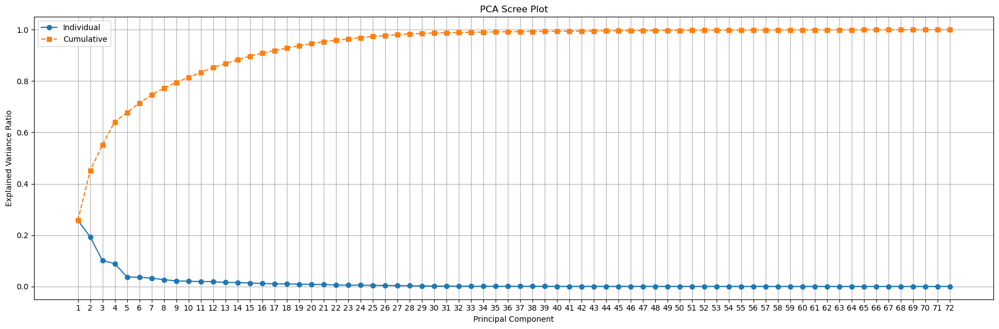

10 components explain ≥80% of variance


In [96]:
#running the PCA pipeline again with the imputed DataFrame
X_pca_n_80, pca_n_80, X_prepped = run_pca_pipeline(df_copy, preprocessor, variance_threshold=0.80)

# Run K-means again

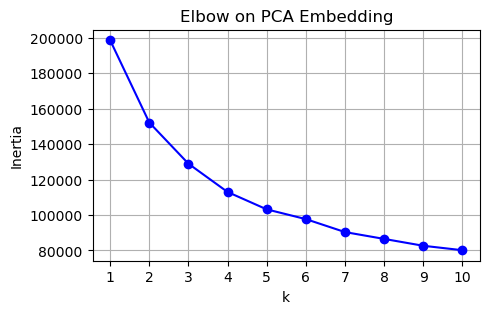

In [97]:

imputed_elbow = plot_pca_elbow(X_pca_n_80)

<u><h3> Observation :</u></h3>
- k = 3 is our best_k according to the elbow method. hence we will use it.

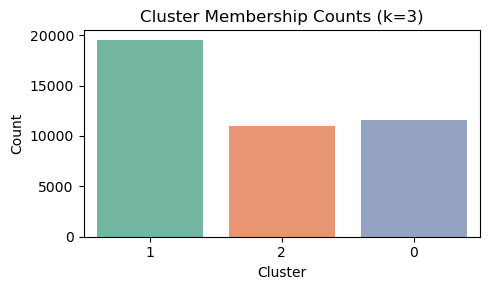

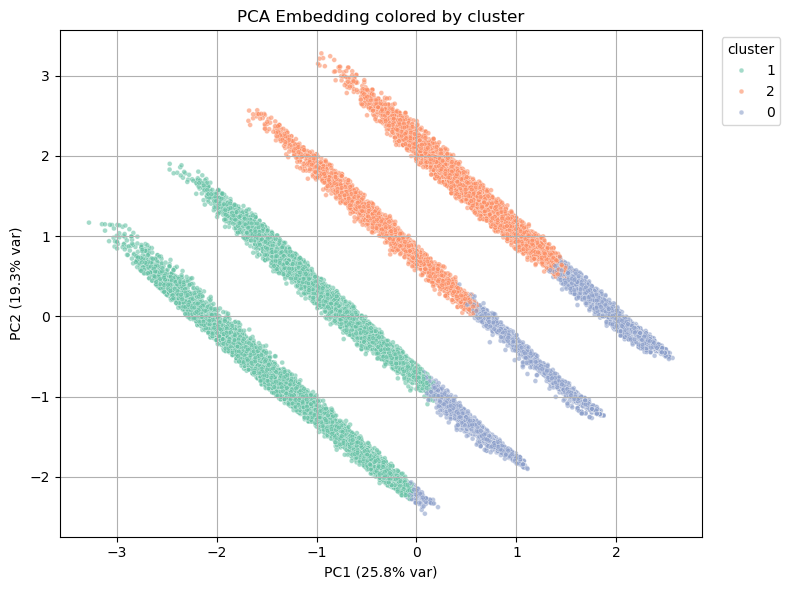

In [98]:
# Choose k based on 'elbow method' 
best_k = 3

# Fit K-Means on the PCA embedding 
km = KMeans(n_clusters=best_k, random_state=42)
km.fit(X_pca_n_80)
labels = km.labels_


#  Attach the cluster labels to our DataFrame 
df_copy['cluster'] = labels.astype(str)    # as str for a categorical hue


# Plot cluster sizes
plot_cluster_sizes(df_copy,'cluster', k=best_k)


# Visualize clusters on the first two PCs
plot_pca_clusters(df_copy, pca_n_80, 'cluster')

In [99]:
new_clusters = cluster_profiles(df_copy)

new_clusters

,age_mean,age_median,age_mode,workclass_mode,marital-status_mode,occupation_mode,relationship_mode,race_mode,sex_mean,sex_median,sex_mode,capital-gain_mean,capital-gain_median,capital-gain_mode,capital-loss_mean,capital-loss_median,capital-loss_mode,native-country_mode,income_mean,income_median,income_mode,hour-type_mode,education-group_mode,PC1_mean,PC1_median,PC1_mode,PC2_mean,PC2_median,PC2_mode,PC3_mean,PC3_median,PC3_mode
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,24.124763,23.0,20,Private,Never-married,Craft-repair,Own-child,White,0.539689,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.005695,0.0,0,Full-time,Some College/Assoc,1.345498,1.523379,1.806126,-0.616574,-0.448079,-1.212290,0.093758,-0.399848,1.380351
1,41.892066,41.0,35,Private,Married-civ-spouse,Prof-specialty,Spouse,White,0.695059,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.284645,0.0,0,Full-time,HS Graduate,-1.027772,-0.985038,-0.595310,-0.367271,-0.339896,-0.086857,-0.008212,-0.189082,-0.700215
2,44.823700,44.0,38,Private,Married-civ-spouse,Craft-repair,Spouse,White,0.701836,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.214467,0.0,0,Full-time,Some College/Assoc,0.405267,0.468844,0.784846,1.300644,1.265146,1.349217,-0.084188,-0.247194,-0.723293


k=2 : silhouette=0.224
k=3 : silhouette=0.203
k=4 : silhouette=0.196
k=5 : silhouette=0.199
k=6 : silhouette=0.197
k=7 : silhouette=0.206
k=8 : silhouette=0.194
k=9 : silhouette=0.180
k=10 : silhouette=0.175


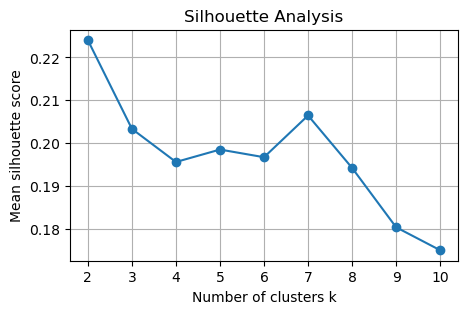

In [100]:
Ks = [2, 3, 4, 5, 6, 7, 8, 9, 10]
sil_scores = []

for k in Ks:
    # 1) Fit K-Means for this k
    km     = KMeans(n_clusters=k, random_state=42).fit(X_pca_n_80)
    labels = km.labels_
    
    # 2) Compute the silhouette score on the same embedding + labels
    score  = silhouette_score(X_pca_n_80, labels, metric='euclidean')
    sil_scores.append(score)
    print(f"k={k} : silhouette={score:.3f}")

# 3) (Optional) Visualize the results
plt.figure(figsize=(5,3))
plt.plot(Ks, sil_scores, 'o-')
plt.xlabel('Number of clusters k')
plt.ylabel('Mean silhouette score')
plt.title('Silhouette Analysis')
plt.grid(True)
plt.show()

<u><h2> Observation :</u></h2>

- Still very low Silhouette Score 

<u><h2> Implication :</u></h2>
- We will try another clustering algorithm --> DBSCAN


In [101]:
# Keep a copy of the DataFrame
df_not_imputed_copy = df_not_imputed.copy()  
df_not_imputed.head()

,age,workclass,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,native-country,income,hour-type,education-group
1,50,Self-emp-not-inc,Married-civ-spouse,Exec-managerial,Spouse,White,1,0,0,United-States,0,Part-time,Bachelor’s or Higher
2,38,Private,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,United-States,0,Full-time,HS Graduate
3,53,Private,Married-civ-spouse,Handlers-cleaners,Spouse,Black,1,0,0,United-States,0,Full-time,Less than HS
4,28,Private,Married-civ-spouse,Prof-specialty,Spouse,Black,0,0,0,Cuba,0,Full-time,Bachelor’s or Higher
5,37,Private,Married-civ-spouse,Exec-managerial,Spouse,White,0,0,0,United-States,0,Full-time,Bachelor’s or Higher


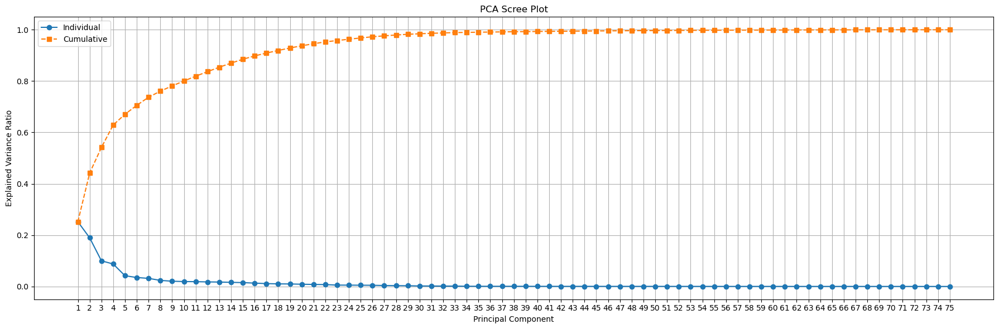

10 components explain ≥80% of variance


In [102]:
#running the PCA pipeline again with the imputed DataFrame
X_pca_n_80, pca_n_80, X_prepped = run_pca_pipeline(df_not_imputed, preprocessor, variance_threshold=0.80)

In [103]:
#t-sne
tsne2 = TSNE(n_components=2,perplexity=10, random_state=42).fit_transform(X_pca_n_80)
df_not_imputed[['TSNE1','TSNE2']] = tsne2


### Common rule of thumb for picking min_samples : min_sample = dim + 1 

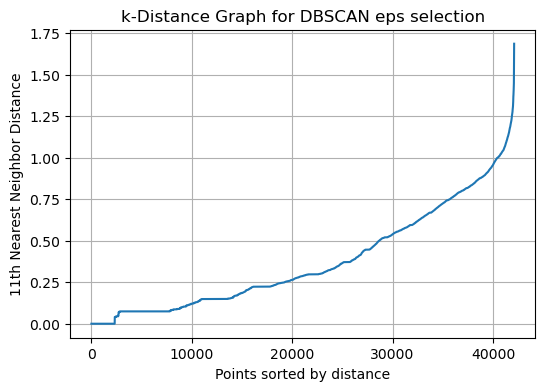

In [104]:
from sklearn.neighbors import NearestNeighbors

k = 11

# 2) Fit a NearestNeighbors model on the same data you'll cluster
nbrs = NearestNeighbors(n_neighbors=k).fit(X_pca_n_80)  
#    X_emb can be X_pca_n_90 (17-D) or your 2-D t-SNE coords

# 3) Find the distance to each point’s k-th nearest neighbor
distances, _ = nbrs.kneighbors(X_pca_n_80)
k_distances = np.sort(distances[:, k-1])  

# 4) Plot them in ascending order
plt.figure(figsize=(6,4))
plt.plot(k_distances)
plt.ylabel(f"{k}th Nearest Neighbor Distance")
plt.xlabel("Points sorted by distance")
plt.title("k-Distance Graph for DBSCAN eps selection")
plt.grid(True)
plt.show()

In [105]:

#DBSCAN clustering
dbscan = DBSCAN(eps= 0.982, min_samples=11, metric='euclidean')
df_not_imputed['dbscan_cluster'] = dbscan.fit_predict(X_pca_n_80).astype(str)




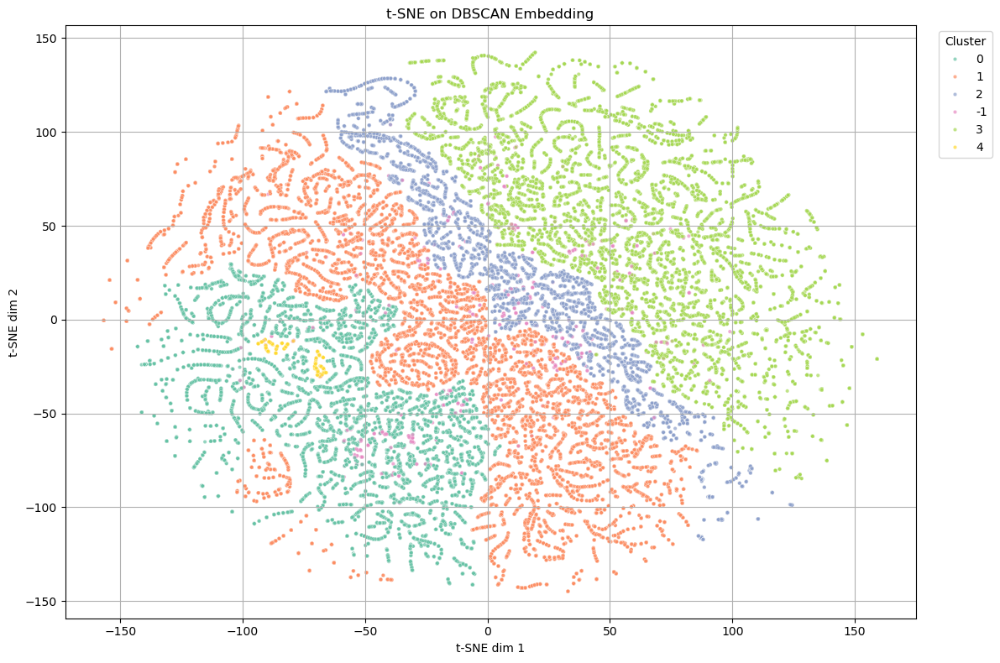

In [106]:

#plotting DBSCAN on PCA embedding
plt.figure(figsize=(12,8))
sns.scatterplot(
    x='TSNE1', y='TSNE2',
    hue ='dbscan_cluster',
    palette='Set2',
    data=df_not_imputed,
    s=10, alpha=0.7
)
plt.title("t-SNE on DBSCAN Embedding")
plt.xlabel("t-SNE dim 1")
plt.ylabel("t-SNE dim 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.02,1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

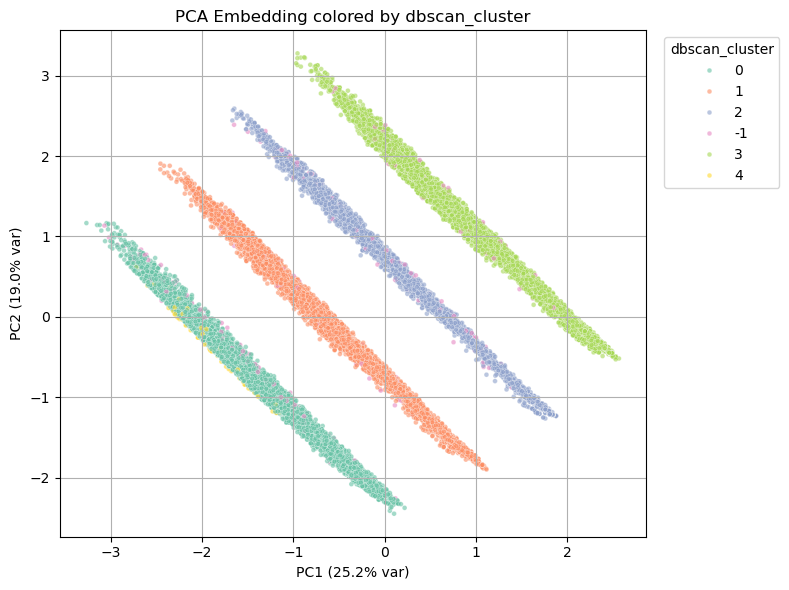

In [107]:
plot_pca_clusters(df_not_imputed, pca_n_80, 'dbscan_cluster')

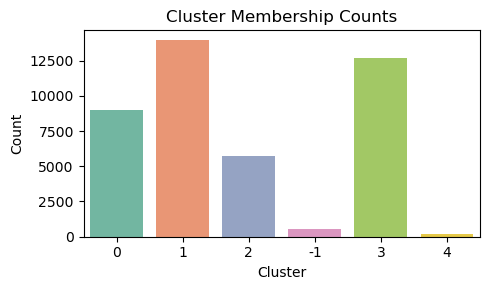

In [108]:
plot_cluster_sizes(df_not_imputed,'dbscan_cluster')

In [109]:
dbscan_clusters = cluster_profiles(df_not_imputed,'dbscan_cluster')
dbscan_clusters

,age_mean,age_median,age_mode,workclass_mode,marital-status_mode,occupation_mode,relationship_mode,race_mode,sex_mean,sex_median,sex_mode,capital-gain_mean,capital-gain_median,capital-gain_mode,capital-loss_mean,capital-loss_median,capital-loss_mode,native-country_mode,income_mean,income_median,income_mode,hour-type_mode,education-group_mode,PC1_mean,PC1_median,PC1_mode,PC2_mean,PC2_median,PC2_mode,PC3_mean,PC3_median,PC3_mode,TSNE1_mean,TSNE1_median,TSNE1_mode,TSNE2_mean,TSNE2_median,TSNE2_mode
dbscan_cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,47.702652,47.0,46,Private,Divorced,Exec-managerial,Not-in-family,Black,0.507576,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.242424,0.0,0,Extreme,Bachelor’s or Higher,-0.476220,-0.476073,0.826969,0.339986,0.361391,1.149747,0.279929,0.539071,-0.658760,-1.607235,0.456709,-3.582336,-6.740919,-9.055117,87.144936
0,39.550017,38.0,24,Private,Married-civ-spouse,Prof-specialty,Spouse,White,0.679295,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.394483,0.0,0,Full-time,Bachelor’s or Higher,-1.288198,-1.343403,-1.861398,-0.899458,-0.853381,-0.335087,0.104215,-0.035260,-0.564186,-61.798965,-58.059299,-141.208633,-48.696854,-48.718906,-108.788490
1,38.358899,36.0,33,Private,Married-civ-spouse,Craft-repair,Spouse,White,0.669056,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.129883,0.0,0,Full-time,HS Graduate,-0.410640,-0.442561,-0.610417,-0.304118,-0.278890,-0.100837,-0.069964,-0.285997,-0.787918,-21.293797,-18.163324,-151.889954,-17.780239,-18.574293,-133.819733
2,37.535596,35.0,17,Private,Married-civ-spouse,Other-service,Spouse,White,0.684450,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.042505,0.0,0,Full-time,Less than HS,0.432093,0.391301,1.809610,0.265978,0.292594,-1.210516,0.077030,-0.233534,1.343582,17.950203,14.662016,110.498833,16.265549,16.331501,-106.252464
3,35.493426,34.0,20,Private,Never-married,Adm-clerical,Spouse,White,0.607747,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.166995,0.0,0,Full-time,Some College/Assoc,1.217721,1.185501,2.490320,0.845591,0.883108,-0.451851,-0.022580,-0.289216,1.361483,61.229736,64.109856,146.845261,46.068027,49.246548,-56.231079
4,41.214286,41.0,38,Private,Married-civ-spouse,Prof-specialty,Spouse,White,0.956044,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.631868,1.0,1,Extreme,Bachelor’s or Higher,-1.800611,-1.782215,-2.132552,-0.427505,-0.428649,-0.473910,-1.461930,-1.479566,-1.556511,-78.546722,-81.661484,-69.415215,-18.734856,-17.061317,-18.669586


In [110]:
dbscan_silhouette_avg = silhouette_score(X_pca_n_80, df_not_imputed['dbscan_cluster'].astype(int))
print(f"Silhouette Score for DBSCAN: {dbscan_silhouette_avg:.3f}")

Silhouette Score for DBSCAN: 0.064


<u><h2> Conclusion :</u></h2>

We got a low silhouette score, we will conclude that DBSCAN with euclidian metric doesnt work well on our data.

# Hierarchical Clustering

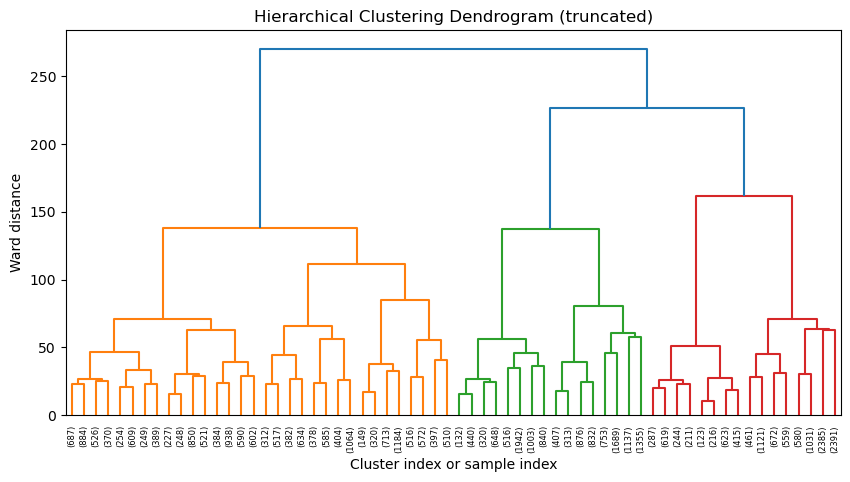

hc_cluster
1    16965
2    13203
0    11938
Name: count, dtype: int64


In [111]:


# 1) Choosing the data we want to cluster on  
X_Hc = X_pca_n_80  # shape = (n_samples, 10)

# 2) Compute a linkage matrix for a dendrogram  
#    'ward' linkage minimizes variance within clusters
Z = linkage(X_Hc, method='ward', metric='euclidean')

# 3) Plot the dendrogram (you may want to sample ~2000 points for speed)
plt.figure(figsize=(10, 5))
dendrogram(
    Z,
    truncate_mode='level',  # show only top levels
    p=5,                    # show only 5 merged clusters
    color_threshold=None
)
plt.title("Hierarchical Clustering Dendrogram (truncated)")
plt.xlabel("Cluster index or sample index")
plt.ylabel("Ward distance")
plt.show()



# 5) use sklearn’s AgglomerativeClustering :
hc = AgglomerativeClustering(
    n_clusters=3,
    linkage='ward'
)
hc_labels = hc.fit_predict(X_Hc)

# 6) Attach to your DataFrame and profile:
df_not_imputed['hc_cluster'] = hc_labels.astype(str)

# 7) Quick cluster-size check:
print(df_not_imputed['hc_cluster'].value_counts())





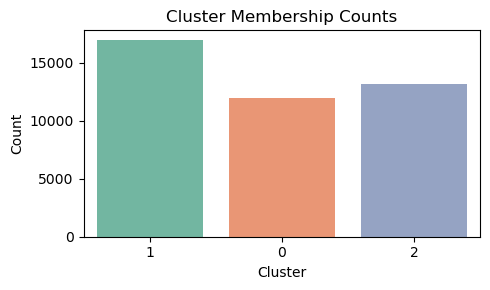

In [112]:
plot_cluster_sizes(df_not_imputed,'hc_cluster')

cluster sizes look somewhat close, it is a good sign.

In [113]:
def plot_tsne_clusters_2D(df, cluster_col='hc_cluster', title="Hierarchical Clusters (ward) on t-SNE embedding"):
    """
    Plots a 2D scatter plot of t-SNE embedding colored by cluster labels.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'TSNE1', 'TSNE2', and cluster label columns.
    cluster_col : str, default='hc_cluster'
        Column name for cluster labels to color the points.
    title : str, optional
        Title for the plot.
    """
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        x='TSNE1', y='TSNE2',
        hue=cluster_col,
        palette='Set2',
        data=df,
        s=10, alpha=0.7
    )
    plt.title(title)
    plt.xlabel("t-SNE dim 1")
    plt.ylabel("t-SNE dim 2")
    plt.legend(title=cluster_col, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

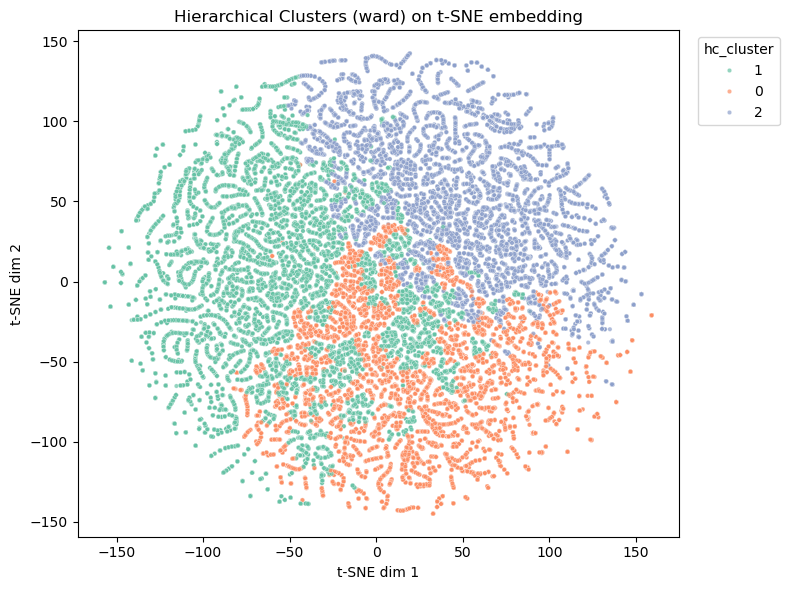

In [114]:
#plotting the t-SNE clusters
plot_tsne_clusters_2D(df_not_imputed, cluster_col='hc_cluster')

<u><h2> Observation :</u></h2>

- Even thouh the cluster sizes are very similar, we can see strong overlaping in the clusters, which suggests that the clustering is not so good.

In [115]:

    #plottoing the clusters in 3d using the function
plot_pca_3d_clusters(df_not_imputed,'hc_cluster',20000)

In [116]:
print("HC silhouette:", silhouette_score(X_Hc, hc_labels))

HC silhouette: 0.1759963481759067


<h2><u> Observation : </h2></u>

- Overall we got a low silhouette score of <= 0.2 for 3 different algorithms which is considered low.

- In those algorithms we used the Euclidian metric, so maybe if we try cosine distances as a metric, we could get a better score ? 

<h2><u> Implication : </h2></u>

- We will try using the cosine distance metric for the algorihms and see if it gets better.



# K-Means with cosine distance metric

In [117]:
X_features = df_not_imputed_copy[columns].copy() 
df_not_imputed_copy2 = df_not_imputed.copy()  # Keep a copy of the DataFrame before clustering
# pipeline up to, but *excluding* KMeans
prep_norm = Pipeline([
    ("prep", preprocessor),
    ("norm", Normalizer()),     
])

X_norm = prep_norm.fit_transform(X_features)

# now run KMeans & silhouette
km     = KMeans(n_clusters=3, random_state=42).fit(X_norm)
labels = km.labels_
#adding the cluster labels to the DataFrame
df_not_imputed['km_cosine_cluster'] = labels.astype(str)


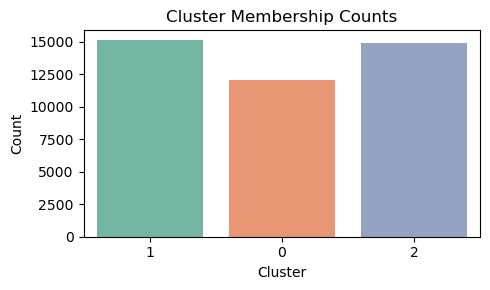

In [118]:
plot_cluster_sizes(df_not_imputed,'km_cosine_cluster')

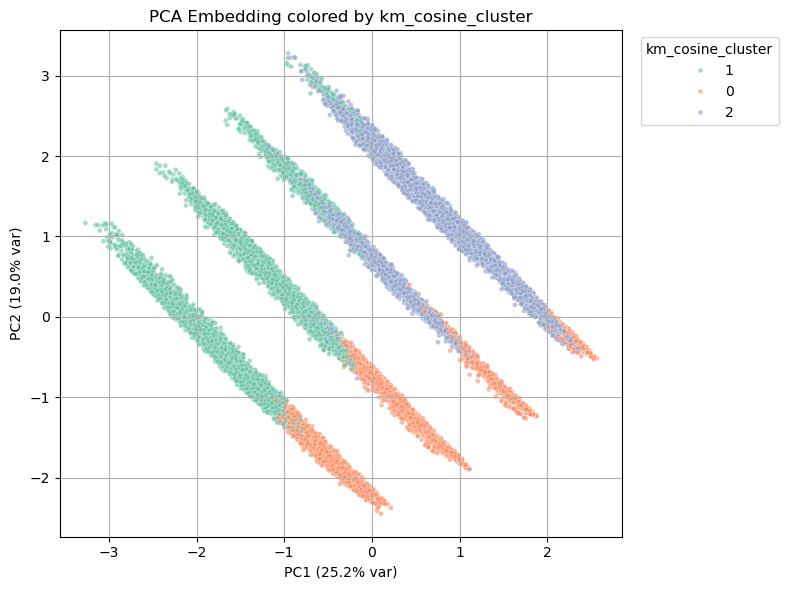

In [119]:
plot_pca_clusters(df_not_imputed,pca_n_80,'km_cosine_cluster')

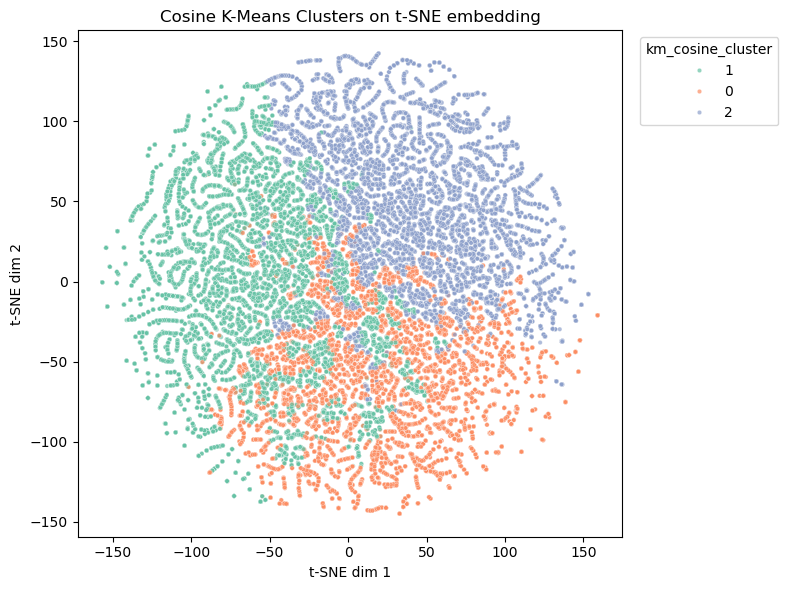

In [120]:
plot_tsne_clusters_2D(df_not_imputed,'km_cosine_cluster', "Cosine K-Means Clusters on t-SNE embedding")

In [121]:
#compute silhouette score for cosine K-Means
cosine_km_score  = silhouette_score(X_norm, labels, metric="cosine")
print("cosine-KMeans silhouette:", cosine_km_score)

cosine-KMeans silhouette: 0.25184605544806316


<h2><u> Observation : </h2></u>

- Changing the metric to 'cosine' got us a ~25% bump in our silhouette score which is a very good sign, althogh in the plots we can see that the clusteres overlap.


<h2><u> Implication : </h2></u>

- We will try Hierarchical Clustering with Cosine Distance metric to see if it can give better results.

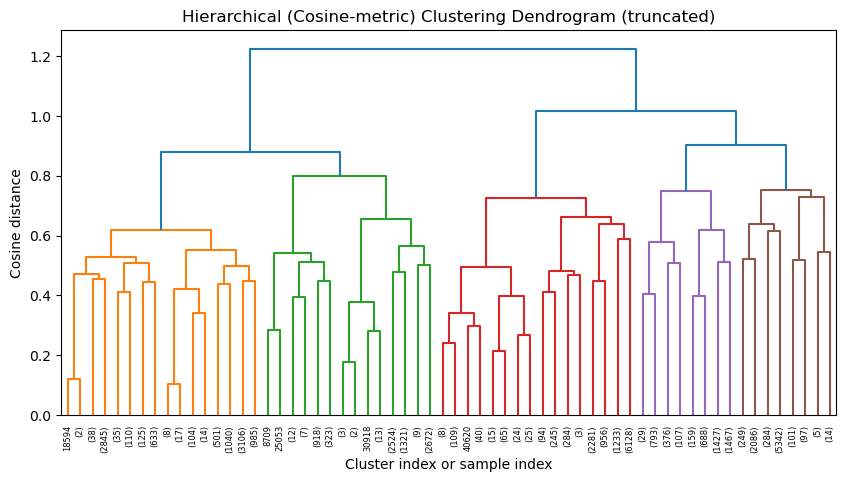

Agglomerative (cosine) silhouette: 0.33165871342790837


In [122]:
X_cosine_hc = X_pca_n_80
#  L2-normalize each sample so that cos(x,y) really is the inner product
normalizer = Normalizer()
X_norm = normalizer.fit_transform(X_cosine_hc)
#  Compute a linkage matrix for a dendrogram  
Z_cosine = linkage(X_norm, method='average', metric='cosine')

#  Plot the dendrogram 
plt.figure(figsize=(10, 5))
dendrogram(
    Z_cosine,
    truncate_mode='level',  # show only top levels
    p=5,                    # show only 5 merged clusters
    color_threshold=None
)
plt.title("Hierarchical (Cosine-metric) Clustering Dendrogram (truncated)")
plt.xlabel("Cluster index or sample index")
plt.ylabel("Cosine distance")
plt.show()


# “average” linkage + cosine distance
hc_cosine = AgglomerativeClustering(
    n_clusters=3,
    metric="cosine",
    linkage="average"
)

# fit on your preprocessed matrix
labels_hc_cos = hc_cosine.fit_predict(X_norm)

# evaluate
print("Agglomerative (cosine) silhouette:", 
      silhouette_score(X_norm, labels_hc_cos, metric="cosine"))


In [123]:
#adding the cluster labels to the DataFrame
df_not_imputed['hc_cosine_cluster'] = labels_hc_cos.astype(str)

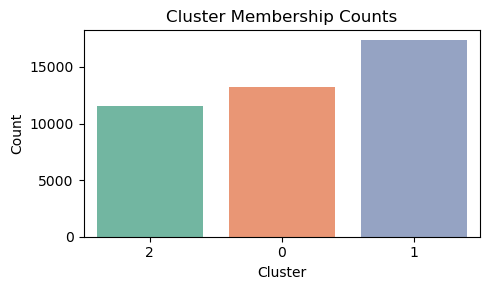

In [124]:
plot_cluster_sizes(df_not_imputed,'hc_cosine_cluster')

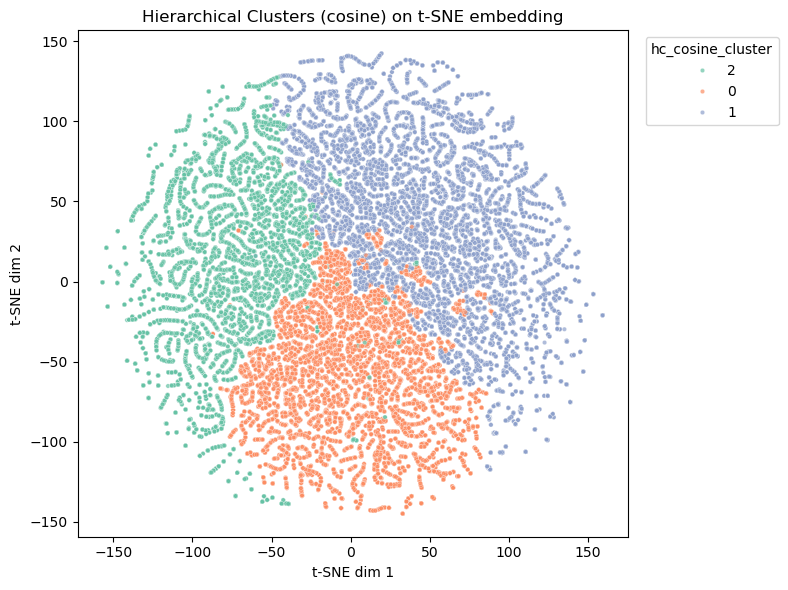

In [125]:
df_not_imputed['hc_cosine_cluster'] = labels_hc_cos.astype(str)
# Plotting the clusters on t-SNE embedding
plot_tsne_clusters_2D(df_not_imputed, 
                      cluster_col='hc_cosine_cluster', 
                      title="Hierarchical Clusters (cosine) on t-SNE embedding")


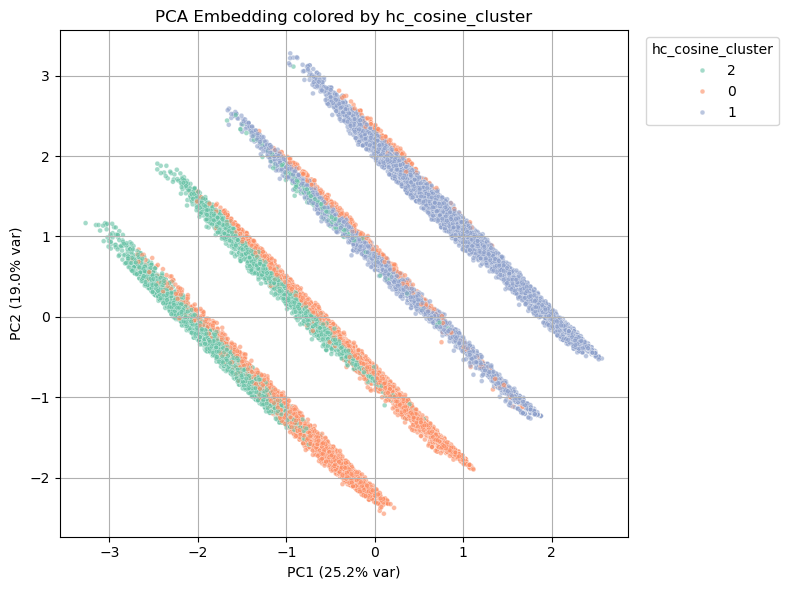

In [126]:
plot_pca_clusters(df_not_imputed, pca_n_80, 'hc_cosine_cluster')

In [127]:
plot_pca_3d_clusters(df_not_imputed, 'hc_cosine_cluster', sample_n=20000)

<h2><u> Observation : </h2></u>

- We got the highest silhouette score yet : 0.331.
- The cluster still overlap a bit.
- Maybe if we take more of the variance, we can get even better results.

<h2><u> Observation : </h2></u>

- Try PCA on 85% of the variance and run HC  with cosine + average linkage on it.

In [128]:
df_CopyFor85Var = df_not_imputed_copy[columns].copy()
df_CopyFor85Var.head()

,age,workclass,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,native-country,income,hour-type,education-group
1,50,Self-emp-not-inc,Married-civ-spouse,Exec-managerial,Spouse,White,1,0,0,United-States,0,Part-time,Bachelor’s or Higher
2,38,Private,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,United-States,0,Full-time,HS Graduate
3,53,Private,Married-civ-spouse,Handlers-cleaners,Spouse,Black,1,0,0,United-States,0,Full-time,Less than HS
4,28,Private,Married-civ-spouse,Prof-specialty,Spouse,Black,0,0,0,Cuba,0,Full-time,Bachelor’s or Higher
5,37,Private,Married-civ-spouse,Exec-managerial,Spouse,White,0,0,0,United-States,0,Full-time,Bachelor’s or Higher


In [129]:
X_pca_n_85, pca_n_85 , X_prepped = run_pca_pipeline(df_CopyFor85Var,preprocessor,0.85,plot=False)

13 components explain ≥85% of variance


To avoid computational complexity we run T-SNE with n=2 components instead of 3.

In [130]:
tsne3 = TSNE(n_components=2,perplexity=10, random_state=42).fit_transform(X_pca_n_85)
df_CopyFor85Var[['TSNE1','TSNE2']] = tsne3


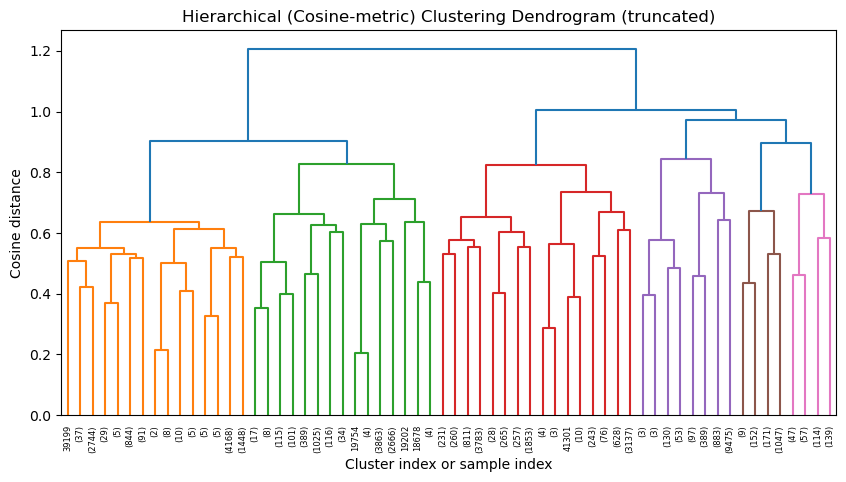

Agglomerative (cosine) silhouette: 0.297215688423034


In [131]:
X_cosine_hc2 = X_pca_n_85
# 2) Compute a linkage matrix for a dendrogram  
#    'ward' linkage minimizes variance within clusters
normalizer2 = Normalizer()
X_norm_85 = normalizer2.fit_transform(X_cosine_hc2)
Z_cosine2 = linkage(X_norm_85, method='average', metric='cosine')

# 3) Plot the dendrogram (you may want to sample ~2000 points for speed)
plt.figure(figsize=(10, 5))
dendrogram(
    Z_cosine2,
    truncate_mode='level',  # show only top levels
    p=5,                    # show only 5 merged clusters
    color_threshold=None
)
plt.title("Hierarchical (Cosine-metric) Clustering Dendrogram (truncated)")
plt.xlabel("Cluster index or sample index")
plt.ylabel("Cosine distance")
plt.show()


# “average” linkage + cosine distance
hc_cosine = AgglomerativeClustering(
    n_clusters=3,
    metric="cosine",
    linkage="average"
)

# fit on your preprocessed matrix
labels_hc_cos2 = hc_cosine.fit_predict(X_norm_85)

# evaluate
print("Agglomerative (cosine) silhouette:", 
      silhouette_score(X_norm_85, labels_hc_cos2, metric="cosine"))

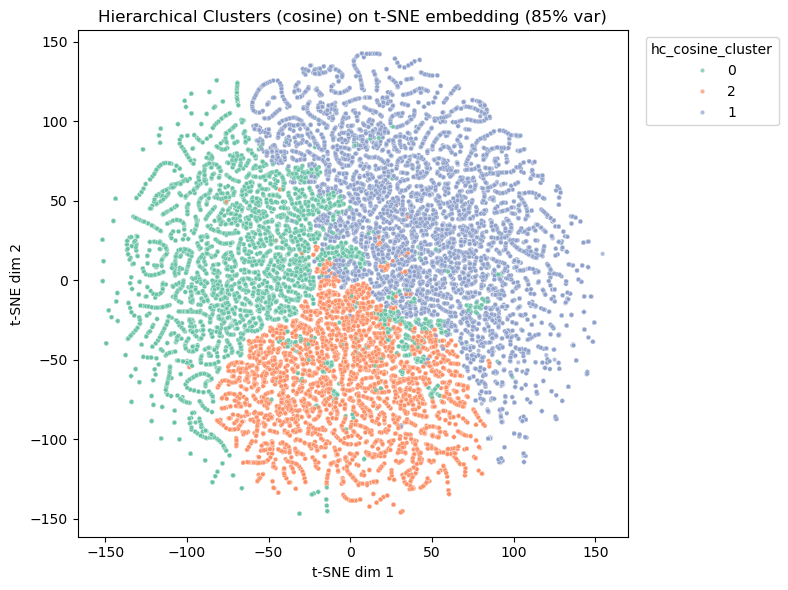

In [132]:
df_CopyFor85Var['hc_cosine_cluster'] = labels_hc_cos2.astype(str)
#plotting the clusters on t-SNE embedding
plot_tsne_clusters_2D(df_CopyFor85Var,'hc_cosine_cluster', "Hierarchical Clusters (cosine) on t-SNE embedding (85% var)")

<h2><u> Observation : </h2></u>

- We got a silhouette score of 0.297 which is lower than the score we got with 80% variance.
- The clusters look vety much like the 80% variance clusters. 


<h2><u> Observation : </h2></u>

- We will proceed with the 80% variance clusters that gor us a score of 0.331 and analyze them.

In [133]:
cosine_hc_profiles2 = cluster_profiles(df_not_imputed,'hc_cosine_cluster',columns)
cosine_hc_profiles2

,age_mean,age_median,age_mode,workclass_mode,marital-status_mode,occupation_mode,relationship_mode,race_mode,sex_mean,sex_median,sex_mode,capital-gain_mean,capital-gain_median,capital-gain_mode,capital-loss_mean,capital-loss_median,capital-loss_mode,native-country_mode,income_mean,income_median,income_mode,hour-type_mode,education-group_mode
hc_cosine_cluster,,,,,,,,,,,,,,,,,,,,,,,
0,36.365396,33.0,23,Private,Never-married,Adm-clerical,Not-in-family,White,0.465895,0.0,0,0.0,0.0,0,0.0,0.0,0,United-States,0.058606,0.0,0,Full-time,HS Graduate
1,35.273617,33.0,20,Private,Never-married,Adm-clerical,Spouse,White,0.640838,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.135341,0.0,0,Full-time,Some College/Assoc
2,43.142212,42.0,38,Private,Married-civ-spouse,Prof-specialty,Spouse,White,0.890192,1.0,1,0.0,0.0,0,0.0,0.0,0,United-States,0.421684,0.0,0,Full-time,HS Graduate


<h2><u>Cluster 0 </h2></u>

	•	Age: on average ~36 years old (median 33), but the single most common age is 23.

	•	Work & Family: overwhelmingly Private-sector, full-time, in Adm-clerical; most are never-married and not-in-family.

	•	Education: mode = HS-Graduate, with very low capital-gain/loss and income flag (~6 % have any gain, almost none > 50K).

	•	Demographics: almost all White, ~46 % female (sex_mean ≈ 0.46).

	•	Income: income_mean ≈ 0.058 means only about 6 % fall into the high-income (> 50K) bracket.

<h3> Interpretation: </h3>This is your young, entry‐level administrative cohort—mostly high-school grads, full-timers in clerical roles, very low capital gains, and low rates of high income.

<h2><u>Cluster 1 </h2></u>

	•	Age: on average ~35 years old (median 33), most common age = 20.

	•	Work & Family: also Private and full-time in Adm-clerical, but these tend to be spouses rather than independent “not-in-family.”

	•	Education: mode = Some College/Assoc, with somewhat higher capital-gain frequency (13 % have any positive gain) and a higher high-income rate (~13 %).
    
	•	Demographics: still predominantly White, but more skewed female (sex_mean ≈ 0.64).

<h3>Interpretation: </h3> A younger, post-secondary-educated administrative cohort—many college/associate attendees, higher female representation, moderate capital gains, and moderate (≈13 %) high-income attainment.

<h2><u>Cluster 2 </h2></u>

	•	Age: older, average ~43 years (median 42), mode age = 38.

	•	Work & Family: mostly Private, full-time, but in Prof-specialty roles; nearly all are married-civ-spouse with the “spouse” relationship.

	•	Education: mode = HS-Graduate (surprising, but note many may have “HS-Graduate” highest degree but professional roles), and this cluster has the highest capital-gain incidence (42 % have positive gains) and high-income rate.

	•	Demographics: again mostly White, ~89 % male (sex_mean ≈ 0.89).

<h2><u>Interpretation:</h2></u>  mid-career professionals—older, married, in specialized roles, with substantial capital gains and the highest rate of > 50K earners.


In [134]:
#rename cluster '0' as Entry-Level Administrators”, cluster 1 as "Early-Career Associates" and cluster 2 a "Mid-Career Professionals"
cosine_hc_profiles2.rename(
    index={
        '0': 'Entry-Level Administrators',
        '1': 'Early-Career Associates',
        '2': 'Mid-Career Professionals'
    },
    inplace=True
)

#apply the new names to the DataFrame
df_not_imputed['hc_cosine_cluster'] = df_not_imputed['hc_cosine_cluster'].replace({
    '0': 'Entry-Level Administrators',
    '1': 'Early-Career Associates',
    '2': 'Mid-Career Professionals'
})


In [135]:
Entry_Level_Administrators = df_not_imputed[df_not_imputed['hc_cosine_cluster'] == 'Entry-Level Administrators']
Early_Career_Associates = df_not_imputed[df_not_imputed['hc_cosine_cluster'] == 'Early-Career Associates']
Mid_Career_Professionals = df_not_imputed[df_not_imputed['hc_cosine_cluster'] == 'Mid-Career Professionals']

# Conclusion

Given the data we got, and our research question  : “How can clustering analysis be applied to population data to form meaningful groups based on employment patterns and education level?”
We can say that :

<u>Clustering can be applied to a population data using </u>:

- Selecting key education and employment features.
- Reducing dimensionality to capture 80 % of variance while preserving structure.
- Normalizing for cosine-style comparisons.
- Applying a Hierarchical Agglomerative Clustering with average linkage + cosine metric on the L₂-normalized PCA-80% embedding to determine clusters .

We discovered three interpretable segments that directly reflect differences in education level (HS-Graduates vs Some-College/Assoc vs professional–role backgrounds) and occupational specialization (administrative vs craft‐repair vs professional‐specialty), along with diverging capital-gain and demographic patterns—while all work full time, it’s their role, education and financial profiles that really set them apart.

